In [1]:
%load_ext autoreload
%autoreload 2
import os
# %set_env PROJ_LIB=/depot/dawson29/apps/condaenv/envs/cent7/5.1.0-py27/pyPIPS/share/proj
# %set_env LD_LIBRARY_PATH=/apps/cent7/intel/compilers_and_libraries_2017.1.132/linux/compiler/lib/intel64
# %set_env LIBRARY_PATH=/apps/cent7/intel/compilers_and_libraries_2017.1.132/linux/compiler/lib/intel64
print(os.environ)
import pyPIPS.dualpara as dualpol
import numpy as np
import numpy.ma as ma
import matplotlib
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import matplotlib.ticker as ticker
import matplotlib.dates as dates
from mpl_toolkits.axes_grid1 import ImageGrid,make_axes_locatable,host_subplot
from mpl_toolkits.basemap import Basemap
from datetime import datetime, timedelta
import pytz as pytz
import sys
import pyPIPS.utils as utils
import pyPIPS.thermolib as thermo
import pyPIPS.DSDlib as dsd
import pyPIPS.disdrometer_module as dis
import pyPIPS.plotmodule as PIPSplot
import pyPIPS.simulator as sim
import pyPIPS.radarmodule as pyPIPSradar
import pyPIPS.PIPS as pips
import pyPIPS.pips_io as pips_io
import pyPIPS.parsivel_qc as pqc
import pyPIPS.parsivel_params as pp
from pyCRMtools.modules import plotmodule as plotmod
from pyCRMtools.modules import utils as CRMutils
from pyCRMtools.pycaps import arps_read
from pyCRMtools.pycaps import pycaps_fields
from pyCRMtools.pycaps import calvars_radar as radar
import pandas as pd
import xarray as xr
import glob
import numpy.random as random
from scipy.stats import gamma, uniform
from scipy.special import gamma as gammafunc
from scipy import ndimage
from metpy.plots import StationPlot
from metpy.calc import get_wind_components
from metpy.cbook import get_test_data
from metpy.plots import StationPlot
from metpy.plots.wx_symbols import current_weather, sky_cover
from metpy.units import units
%matplotlib inline

environ({'MKLROOT': '/apps/cent7/intel/compilers_and_libraries_2017.1.132/linux/mkl', 'LMOD_FAMILY_COMPILER_VERSION': '17.0.1.132', 'PROJ_LIB': '/depot/dawson29/apps/condaenv/envs/cent7/5.1.0-py27/pyPIPS/share/proj', 'XALT_ETC_DIR': '/apps/cent7/xalt/etc', 'HOSTNAME': 'rice-a546.rcac.purdue.edu', 'VT_MPI': 'impi2017', '_ModuleTable003_': 'Ny4wLjEuMTMyLmx1YSIsWyJmdWxsTmFtZSJdPSJpbnRlbC8xNy4wLjEuMTMyIixbImxvYWRPcmRlciJdPTEscHJvcFQ9e30sWyJzdGFja0RlcHRoIl09MSxbInN0YXR1cyJdPSJhY3RpdmUiLFsidXNlck5hbWUiXT0iaW50ZWwvMTcuMC4xLjEzMiIsfSxuY2w9e1siZm4iXT0iL29wdC9tb2R1bGVmaWxlcy9jb3JlL25jbC82LjQuMC5sdWEiLFsiZnVsbE5hbWUiXT0ibmNsLzYuNC4wIixbImxvYWRPcmRlciJdPTgscHJvcFQ9e30sWyJzdGFja0RlcHRoIl09MCxbInN0YXR1cyJdPSJhY3RpdmUiLFsidXNlck5hbWUiXT0ibmNsIix9LG5ldGNkZjQ9e1siZm4iXT0iL29wdC9tb2R1bGVmaWxlcy9jb21waWxlci9pbnRlbC8xNy4wLjEuMTMyL25ldGNkZjQvNC41LjAubHVhIixbImZ1', 'OLD_NCARG_ROOT': '/apps/cent7/ncl/6.4.0', 'PBS_VERSION': 'TORQUE-5.1.3', 'ORIG_SHELL': '/bin/bash', 'IPPROOT': '/apps/cent7/intel/compilers_and


## You are using the Python ARM Radar Toolkit (Py-ART), an open source
## library for working with weather radar data. Py-ART is partly
## supported by the U.S. Department of Energy as part of the Atmospheric
## Radiation Measurement (ARM) Climate Research Facility, an Office of
## Science user facility.
##
## If you use this software to prepare a publication, please cite:
##
##     JJ Helmus and SM Collis, JORS 2016, doi: 10.5334/jors.119



/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/pyart/graph/cm.py:104: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if 'red' in spec:
/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/pyart/graph/cm_colorblind.py:32: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if 'red' in spec:


In [2]:
# Define dictionaries, keyed by case date (i.e. '060509', '060709', '060909', '033116'), to store parameters related
# to NEXRAD radar data, disdrometer data, and model output, respectively

# Case we are looking at right now. Should only have to change this up here and then execute all the cells below
# to generate the appropriate analysis
casedate = '033116'

# Import the file containing the dictionaries needed to gather the radar, disdrometer, and model data.
sys.path.append('/depot/dawson29/data/Projects/VORTEXSE/vortexse_enkf_dsd_study/configs/2016_IOP3')

from PIPSsim_1km_dicts_rice import *

init_radar_dict = init_radar_dict[casedate]
init_dis_dict = init_dis_dict[casedate]
init_model_dict = init_model_dict[casedate]

load_pkl = True

In [3]:
import pickle

pkl_dir = '/depot/dawson29/data/Projects/VORTEXSE/vortexse_enkf_dsd_study/data/radar_data/pkl'
pkl_file = '{}_KGWX.pkl'.format(casedate)
pkl_path = os.path.join(pkl_dir, pkl_file)

# Now go ahead and read in the sweeps for the desired case
if not load_pkl:
    radar_dict = sim.read_sweeps(init_radar_dict)
    # Dump radar dictonary to pickle file
    with open(pkl_path, 'wb') as pkl_file_obj:
        pickle.dump(radar_dict, pkl_file_obj)
else:
    with open(pkl_path, 'rb') as pkl_file_obj:
        radar_dict = pickle.load(pkl_file_obj)

In [4]:
# Now do the same for the model output
# First set up some stuff

def get_ARPS_member_dir_and_prefix(member, cycle):
    """
    Gets the proper form for the subdirectory and file prefix name given a member number
    and cycle type (either 'posterior' or 'prior'). member number 0 is interpreted as the mean. 
    """
    if member == 0:
        if cycle in 'posterior':
            member_dir = 'ENamean'
            member_prefix = 'enmean'
        elif cycle in 'prior':
            member_dir = 'ENfmean'
            member_prefix = 'efmean'
    else:
        if cycle in 'posterior':
            member_dir = 'EN{:03d}'.format(int(member))
            member_prefix = 'ena{:03d}'.format(int(member))
        elif cycle in 'prior':
            member_dir = 'ENF{:03d}'.format(int(member))
            member_prefix = 'enf{:03d}'.format(int(member))
    
    return member_dir, member_prefix

modelname = 'ARPS'
microphys = 'ZVD'

# From desired start and end times (UTC) get a range of datetimes and corresponding range of times in
# seconds since model initial time
timestamp_model_init = init_model_dict['timestamp_model_init']  # Start time of model corresponding to 0 s
datetime_model_init = datetime.strptime(timestamp_model_init, '%Y%m%d%H%M%S')

timestamp_start = init_model_dict['timestamp_model_start']  # Start time of desired time window
timestamp_stop = init_model_dict['timestamp_model_stop']  # Stop time of desired time window
datetime_start = datetime.strptime(timestamp_start, '%Y%m%d%H%M%S')
datetime_stop = datetime.strptime(timestamp_stop, '%Y%m%d%H%M%S')
tintv = init_model_dict['model_dt']  # Interval in seconds for model output
tintv_mean = init_model_dict['model_dt_mean'] # Interval in seconds for ensemble mean analysis

datetime_range = CRMutils.get_datetime_range(datetime_start, datetime_stop, tintv)
trange = CRMutils.modeltimes_from_datetimes(datetime_range, datetime_start=datetime_model_init)

datetime_range_mean = CRMutils.get_datetime_range(datetime_start, datetime_stop, tintv_mean)
trange_mean = CRMutils.modeltimes_from_datetimes(datetime_range_mean, datetime_start=datetime_model_init)

#basedir = '/Volumes/scr_fast/Projects/VORTEXSE/simulations/ARPS/2016_IOP3/3DVAR/1km0331163DVARCA00005min180_3km030015min540'
fileformat = init_model_dict['fileformat']
expname = '1km453x453_033116_newse'
basedir = init_model_dict['basedirname']
member = 1 # 0 is for ensemble mean
cycle = 'posterior'
member_dir, member_prefix = get_ARPS_member_dir_and_prefix(member, cycle)
member_absdir = os.path.join(basedir, expname, member_dir)
trailer = ''
nproc_x = 15
nproc_y = 6

if member == 0:
    model_trange_sec = trange_mean
    model_datetime_range = datetime_range_mean
else:
    model_trange_sec = trange
    model_datetime_range = datetime_range
    
model_dict = init_model_dict.copy()

model_dict['trange_member'] = trange
model_dict['trange_mean'] = trange_mean
model_dict['datetime_range_member'] = datetime_range
model_dict['datetime_range_mean'] = datetime_range_mean


if member == 0:
    model_dict['trange'] = trange_mean
    model_dict['datetime_range'] = datetime_range_mean
else:
    model_dict['trange'] = trange
    model_dict['datetime_range'] = datetime_range
    
print(model_datetime_range)

[datetime.datetime(2016, 3, 31, 22, 0), datetime.datetime(2016, 3, 31, 22, 1), datetime.datetime(2016, 3, 31, 22, 2), datetime.datetime(2016, 3, 31, 22, 3), datetime.datetime(2016, 3, 31, 22, 4), datetime.datetime(2016, 3, 31, 22, 5), datetime.datetime(2016, 3, 31, 22, 6), datetime.datetime(2016, 3, 31, 22, 7), datetime.datetime(2016, 3, 31, 22, 8), datetime.datetime(2016, 3, 31, 22, 9), datetime.datetime(2016, 3, 31, 22, 10), datetime.datetime(2016, 3, 31, 22, 11), datetime.datetime(2016, 3, 31, 22, 12), datetime.datetime(2016, 3, 31, 22, 13), datetime.datetime(2016, 3, 31, 22, 14), datetime.datetime(2016, 3, 31, 22, 15), datetime.datetime(2016, 3, 31, 22, 16), datetime.datetime(2016, 3, 31, 22, 17), datetime.datetime(2016, 3, 31, 22, 18), datetime.datetime(2016, 3, 31, 22, 19), datetime.datetime(2016, 3, 31, 22, 20), datetime.datetime(2016, 3, 31, 22, 21), datetime.datetime(2016, 3, 31, 22, 22), datetime.datetime(2016, 3, 31, 22, 23), datetime.datetime(2016, 3, 31, 22, 24), datetime.

In [5]:
# Load the ARPS grid
# Get file path for grdbas file (note that call to read_grid handles the reading of the individual patches)
# If the grdbas file doesn't exist, fall back to a history file
load_pkl = True
pkl_dir = '/depot/dawson29/data/Projects/VORTEXSE/vortexse_enkf_dsd_study/data/model_data/pkl'
pkl_file = '{}_grid_dict.pkl'.format(casedate)
pkl_path = os.path.join(pkl_dir, pkl_file)

grdbas_path = arps_read.get_file_path(member_absdir, member_prefix, fileformat, filetype='grdbas')
patch_x = 1
patch_y = 1
grdbas_path_test = arps_read.add_patch_number(grdbas_path, patch_x, patch_y)

if not os.path.exists(grdbas_path_test):
    print("grdbas file doesn't exist, trying a history file!")
    grdbas_path = arps_read.get_file_path(member_absdir, member_prefix, fileformat, time=model_trange_sec[0], 
                                          filetype='history')
    grdbas_path_test = arps_read.add_patch_number(grdbas_path, patch_x, patch_y)

    print(grdbas_path_test)
    print(os.path.exists(grdbas_path_test))

if not load_pkl:
    # Read in grid information
    grid_dict = arps_read.readarpsgrid(grdbas_path, nproc_x=nproc_x, nproc_y=nproc_y)
    # Get map projection information

    ctrlat, ctrlon, trulat1, trulat2, trulon = arps_read.readarpsmap(grdbas_path, nproc_x=nproc_x, nproc_y=nproc_y)
    grid_dict['ctrlat'] = ctrlat
    grid_dict['ctrlon'] = ctrlon
    grid_dict['trulat1'] = trulat1
    grid_dict['trulat2'] = trulat2
    grid_dict['trulon'] = trulon
    # Dump grid dictonary to pickle file
    with open(pkl_path, 'wb') as pkl_file_obj:
        pickle.dump(grid_dict, pkl_file_obj)
else:
    with open(pkl_path, 'rb') as pkl_file_obj:
        grid_dict = pickle.load(pkl_file_obj)

In [6]:
# Get map projection information and create a Basemap instance
# TODO: convert to use cartopy!
dx = grid_dict['dx']
dy = grid_dict['dy']
nx = grid_dict['nx']
ny = grid_dict['ny']
trulat1 = grid_dict['trulat1']
trulat2 = grid_dict['trulat2']
ctrlat = grid_dict['ctrlat']
ctrlon = grid_dict['ctrlon']


mapwidth = nx * dx
mapheight = ny * dy

bgmap = Basemap(projection='lcc', width=mapwidth, height=mapheight, lat_1=trulat1,
                lat_2=trulat2, lat_0=ctrlat, lon_0=ctrlon, resolution='h',
                area_thresh=10., suppress_ticks=False)

# Put the basemap instance into the grid_dict
grid_dict['bgmap'] = bgmap

dis_dict = sim.get_dis_locs_relative_to_radar(init_dis_dict, radar_dict)
# Find coordinates of PIPS stations in the model
dis_dict = sim.get_dis_locs_arps_real_grid(dis_dict, grid_dict)


coord_array = np.array(dis_dict['dmodcrdlist'])

print(coord_array) 
print(coord_array.shape) 
print(coord_array[0]) 
# coord_array = coord_array.T

59330.32776277612 128017.96632299136
55448.5738843375 132178.38106581278
59881.26085749139 124592.88030225059
53192.538955316544 139656.4713703329
[[226.22825433 253.40098553]
 [222.37480154 257.58480521]
 [226.75691376 249.97353499]
 [220.16784265 265.07492488]]
(4, 2)
[226.22825433 253.40098553]


In [8]:
# Read in the model fields from previously generated netCDF files
num_members = 36
member_range = range(1, num_members+1)

var_ds_list = []
for member in member_range:
    member_dir, member_prefix = get_ARPS_member_dir_and_prefix(member, cycle)
    ncfilename = member_prefix + '_fields.nc'
    ncdir = '/depot/dawson29/data/Projects/VORTEXSE/vortexse_enkf_dsd_study/data/model_data/nc'
    ncfilepath = os.path.join(ncdir, ncfilename)

    # Open the Dataset
    var_ds = xr.open_dataset(ncfilepath)
    var_ds_list.append(var_ds)

In [9]:
# Read in PIPS data

print(dis_dict.keys())

dis_dir = dis_dict['dis_dir']
dis_filenames = dis_dict['disfilenames']
dis_names = dis_dict['dis_names']

conv_df_dict = {}
parsivel_df_dict = {}
vd_matrix_da_dict = {}

for dis_filename, dis_name in zip(dis_filenames, dis_names):
    dis_filepath = os.path.join(dis_dir, dis_filename)
    print("Reading {}".format(dis_filepath))
    conv_df, parsivel_df, vd_matrix_da = pips_io.read_PIPS(dis_filepath, starttimestamp=timestamp_start,
                                                           stoptimestamp=timestamp_stop)
    # Calculate some additional thermodynamic quantities and add to the conventional data DataFrame
    conv_df = pips.calc_thermo(conv_df)
    conv_df_dict[dis_name] = conv_df
    parsivel_df_dict[dis_name] = parsivel_df
    vd_matrix_da_dict[dis_name] = vd_matrix_da

dict_keys(['dis_dir', 'dis_types', 'dis_names', 'disfilenames', 'convfilenames', 'starttimes', 'stoptimes', 'interval', 'dgeoloclist', 'dradloclist', 'dmodloclist', 'dmodcrdlist'])
Reading /depot/dawson29/data/Projects/VORTEXSE/obsdata/2016/PIPS/processed/IOP3/PIPS_1A_IOP_3_D1.txt
GPS time: Thu Mar 31 22:12:03 2016, Logger time: Thu Mar 31 22:12:00 2016
GPS Offset: 0:00:03
Reading /depot/dawson29/data/Projects/VORTEXSE/obsdata/2016/PIPS/processed/IOP3/PIPS_1B_IOP_3_D1.txt
GPS time: Thu Mar 31 22:01:33 2016, Logger time: Thu Mar 31 22:01:30 2016
GPS Offset: 0:00:03
Reading /depot/dawson29/data/Projects/VORTEXSE/obsdata/2016/PIPS/processed/IOP3/PIPS_2A_IOP_3_D1.txt
GPS time: Thu Mar 31 22:25:03 2016, Logger time: Thu Mar 31 22:25:00 2016
GPS Offset: 0:00:03
Reading /depot/dawson29/data/Projects/VORTEXSE/obsdata/2016/PIPS/processed/IOP3/PIPS_2B_IOP_3_D1.txt
GPS time: Thu Mar 31 21:48:23 2016, Logger time: Thu Mar 31 21:48:20 2016
GPS Offset: 0:00:03


In [10]:
# Resample PIPS data to a 60-s interval
conv_rs_df_dict = {}
parsivel_rs_df_dict = {}
vd_matrix_rs_da_dict = {}
for dis_name in dis_names:
    # Conventional data
    conv_df = conv_df_dict[dis_name]
    datetime_range_onesec = conv_df.index.to_pydatetime()
    sec_offset = pips.get_offset_seconds(datetime_range_onesec)
    conv_rs_df_dict[dis_name] = pips.resample_conv('PIPS', 60., sec_offset, conv_df, gusts=True)
    
    # Parsivel 10-s derived fields
    parsivel_df = parsivel_df_dict[dis_name]
    datetime_range_tensec = parsivel_df.index.to_pydatetime()
    sec_offset = pips.get_offset_seconds(datetime_range_tensec)
    print(sec_offset)
    parsivel_rs_df_dict[dis_name] = pips.resample_parsivel(60., parsivel_df)
    
    # Parsivel V-D matrix
    vd_matrix_da = vd_matrix_da_dict[dis_name]
    vd_matrix_rs_da_dict[dis_name] = pips.resample_vd_matrix(60., vd_matrix_da)

53
13
53
3


/home/dawson29/Projects/pyPIPS/pyPIPS/PIPS.py:282: FutureWarning: using a dict with renaming is deprecated and will be removed
in a future version.

For column-specific groupby renaming, use named aggregation

    >>> df.groupby(...).agg(name=('column', aggfunc))

  'hailflag': np.any}).fillna(0)


In [11]:
# Compute N(D) for the observed PIPS DSDs after some QC
min_diameters = pp.parsivel_parameters['min_diameter_bins_mm']
mid_diameters = pp.parsivel_parameters['avg_diameter_bins_mm']
max_diameters = pp.parsivel_parameters['max_diameter_bins_mm']
mid_fallspeeds = pp.parsivel_parameters['avg_fallspeed_bins_mps']
empirical_fallspeed = pips.calc_empirical_fallspeed(mid_diameters)
fallspeed_spectrum = pips.calc_fallspeed_spectrum(mid_diameters, mid_fallspeeds, use_measured_fallspeed=True)

ND_PIPS_dict = {}
logND_PIPS_dict = {}
PSD_datetimes_rs_PIPS_dict = {}

for dis_name in dis_names:
    vd_matrix_rs_da = vd_matrix_rs_da_dict[dis_name]
    vd_matrix_rs_QC = pqc.strongwindQC(vd_matrix_rs_da)
    vd_matrix_rs_QC = pqc.rainonlyQC(vd_matrix_rs_QC)
    # Calculate ND and log10(ND)
    ND = pips.calc_ND(vd_matrix_rs_QC.where(vd_matrix_rs_QC > 0.0), fallspeed_spectrum, 60.)
    logND = np.log10(ND)
    logND = logND.where(logND > -1.0)
    
    ND_PIPS_dict[dis_name] = ND
    logND_PIPS_dict[dis_name] = logND
    # Get times for PIPS transects as numpy arrays of python datetime objects
    PSD_datetimes_rs = pips.get_PSD_datetimes(vd_matrix_rs_da)
    PSD_datetimes_rs_dict = pips.get_PSD_time_bins(PSD_datetimes_rs)
    PSD_datetimes_rs_PIPS_dict[dis_name] = PSD_datetimes_rs_dict

Severe Wind contamination, masking entire PSD!
Severe Wind contamination, masking entire PSD!
65
Severe Wind contamination, masking entire PSD!
84
Severe Wind contamination, masking entire PSD!
Severe Wind contamination, masking entire PSD!
45


/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)


Severe Wind contamination, masking entire PSD!
95


In [12]:
# Compute some radar and DSD parameters from DSD
import pyPIPS.polarimetric as pol
wavelength = 10.7
scatt_file = '/home/dawson29/Projects/pyPIPS/tmatrix/S-Band/SCTT_RAIN_fw100.dat'
bin_width = pp.parsivel_parameters['max_diameter_bins_mm'] - pp.parsivel_parameters['min_diameter_bins_mm']
dualpol_PIPS_dict = {}
ZDR_PIPS_dict = {}
dBZ_PIPS_dict = {}
D0_PIPS_dict = {}
for dis_name in dis_names:
    dBZ_PIPS = dsd.calc_dBZ_from_bins(ND_PIPS_dict[dis_name])
    dBZ_PIPS = dBZ_PIPS.where(dBZ_PIPS > -np.inf)
    dBZ_PIPS_dict[dis_name] = dBZ_PIPS
    D0_PIPS = dsd.calc_D0_bin(ND_PIPS_dict[dis_name])
    D0_PIPS_dict[dis_name] = D0_PIPS
    pol_PIPS_dict = pol.calpolrain(wavelength, scatt_file, ND_PIPS_dict[dis_name], bin_width)
    dualpol_PIPS_dict[dis_name] = pol_PIPS_dict

/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)
/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)
/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)
/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)
/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)
/home/dawson29/

In [13]:
# Interpolate the model variables to the PIPS locations
x_coords = [a[0] for a in dis_dict['dmodloclist']]
y_coords = [a[1] for a in dis_dict['dmodloclist']]

x_coords_da = xr.DataArray(x_coords, coords=[dis_names], dims=['PIPS'])
y_coords_da = xr.DataArray(y_coords, coords=[dis_names], dims=['PIPS'])

var_ds_interp_list = []
for i, member in enumerate(member_range):
    var_ds = var_ds_list[i]
    var_ds_interp = var_ds.interp(xc=x_coords_da, yc=y_coords_da)
    var_ds_interp_list.append(var_ds_interp)

In [14]:
# Compute raw model DSD at PIPS locations
rhor = 1000.
cr = np.pi / 6. * rhor

qr_model_PIPS_list = []
nr_model_PIPS_list = []
zr_model_PIPS_list = []
rho_model_PIPS_list = []
alphar_model_PIPS_list = []
N0r_model_PIPS_list = []
lamdar_model_PIPS_list = []

for var_ds_interp in var_ds_interp_list:
    p_interp = var_ds_interp['p']
    pt_interp = var_ds_interp['pt']
    qv_interp = var_ds_interp['qv']
    qr_model_PIPS = var_ds_interp['qr']
    nr_model_PIPS = var_ds_interp['nr']
    zr_model_PIPS = var_ds_interp['zr']
    rho_model_PIPS = thermo.calrho(p_interp, pt_interp, qv_interp)

    # Shape parameter
    # alphar_atPIPS = dualpol.solve_alpha_iter(rhoa_atPIPS, mu, qr_atPIPS, nr_atPIPS, zr_atPIPS, rhor)
    alphar_model_PIPS = dsd.solve_alpha(rho_model_PIPS, cr, qr_model_PIPS, nr_model_PIPS, zr_model_PIPS)
    # Intercept parameter
    N0r_model_PIPS = dsd.calc_N0_gamma(rho_model_PIPS, qr_model_PIPS, nr_model_PIPS, cr, alphar_model_PIPS)
    # Slope parameter
    lamdar_model_PIPS = dsd.calc_lamda_gamma(rho_model_PIPS, qr_model_PIPS, nr_model_PIPS, cr, alphar_model_PIPS)
    
    qr_model_PIPS_list.append(qr_model_PIPS)
    nr_model_PIPS_list.append(nr_model_PIPS)
    zr_model_PIPS_list.append(zr_model_PIPS)
    rho_model_PIPS_list.append(rho_model_PIPS)
    alphar_model_PIPS_list.append(alphar_model_PIPS)
    N0r_model_PIPS_list.append(N0r_model_PIPS)
    lamdar_model_PIPS_list.append(lamdar_model_PIPS)

/home/dawson29/Projects/pyPIPS/pyPIPS/DSDlib.py:419: RuntimeWarning: divide by zero encountered in true_divide
  tmp1 = cx / (rhoa * q)
/home/dawson29/Projects/pyPIPS/pyPIPS/DSDlib.py:139: RuntimeWarning: divide by zero encountered in true_divide
  lamda = ((gamma4alp / gamma1alp) * cx * Ntx / (rhoa * q))**(1.0 / 3.0)
/home/dawson29/Projects/pyPIPS/pyPIPS/DSDlib.py:139: RuntimeWarning: divide by zero encountered in true_divide
  lamda = ((gamma4alp / gamma1alp) * cx * Ntx / (rhoa * q))**(1.0 / 3.0)
/home/dawson29/Projects/pyPIPS/pyPIPS/DSDlib.py:419: RuntimeWarning: divide by zero encountered in true_divide
  tmp1 = cx / (rhoa * q)
/home/dawson29/Projects/pyPIPS/pyPIPS/DSDlib.py:420: RuntimeWarning: invalid value encountered in multiply
  g = tmp1 * Z * tmp1 * Ntx
/home/dawson29/Projects/pyPIPS/pyPIPS/DSDlib.py:139: RuntimeWarning: divide by zero encountered in true_divide
  lamda = ((gamma4alp / gamma1alp) * cx * Ntx / (rhoa * q))**(1.0 / 3.0)
/home/dawson29/Projects/pyPIPS/pyPIPS/DSD

/home/dawson29/Projects/pyPIPS/pyPIPS/DSDlib.py:419: RuntimeWarning: divide by zero encountered in true_divide
  tmp1 = cx / (rhoa * q)
/home/dawson29/Projects/pyPIPS/pyPIPS/DSDlib.py:420: RuntimeWarning: invalid value encountered in multiply
  g = tmp1 * Z * tmp1 * Ntx
/home/dawson29/Projects/pyPIPS/pyPIPS/DSDlib.py:139: RuntimeWarning: divide by zero encountered in true_divide
  lamda = ((gamma4alp / gamma1alp) * cx * Ntx / (rhoa * q))**(1.0 / 3.0)
/home/dawson29/Projects/pyPIPS/pyPIPS/DSDlib.py:139: RuntimeWarning: divide by zero encountered in true_divide
  lamda = ((gamma4alp / gamma1alp) * cx * Ntx / (rhoa * q))**(1.0 / 3.0)
/home/dawson29/Projects/pyPIPS/pyPIPS/DSDlib.py:419: RuntimeWarning: divide by zero encountered in true_divide
  tmp1 = cx / (rhoa * q)
/home/dawson29/Projects/pyPIPS/pyPIPS/DSDlib.py:420: RuntimeWarning: invalid value encountered in multiply
  g = tmp1 * Z * tmp1 * Ntx
/home/dawson29/Projects/pyPIPS/pyPIPS/DSDlib.py:139: RuntimeWarning: divide by zero encoun

In [15]:
# Save for posterity, now part of var_ds dataset above

# EDIT: Temp fix until I get the above functions to work properly with xarray
# convert alphar, N0r, lamdar back to DataArrays

alphar_model_allPIPS_da_list = []
N0r_model_allPIPS_da_list = []
lamdar_model_allPIPS_da_list = []

for alphar_model_PIPS, qr_model_PIPS, N0r_model_PIPS, lamdar_model_PIPS in \
    zip(alphar_model_PIPS_list, qr_model_PIPS_list, N0r_model_PIPS_list, lamdar_model_PIPS_list):

    alphar_model_allPIPS_da = xr.DataArray(alphar_model_PIPS,
                                        coords={
                                            'time': qr_model_PIPS['time'],
                                            'PIPS': ['PIPS1A', 'PIPS1B', 'PIPS2A', 'PIPS2B']
                                        },
                                        dims=['time', 'PIPS'])
    N0r_model_allPIPS_da = xr.DataArray(N0r_model_PIPS,
                                        coords={
                                            'time': qr_model_PIPS['time'],
                                            'PIPS': ['PIPS1A', 'PIPS1B', 'PIPS2A', 'PIPS2B']
                                        },
                                        dims=['time', 'PIPS'])
    lamdar_model_allPIPS_da = xr.DataArray(lamdar_model_PIPS,
                                        coords={
                                            'time': qr_model_PIPS['time'],
                                            'PIPS': ['PIPS1A', 'PIPS1B', 'PIPS2A', 'PIPS2B']
                                        },
                                        dims=['time', 'PIPS'])
    
    alphar_model_allPIPS_da_list.append(alphar_model_allPIPS_da)
    N0r_model_allPIPS_da_list.append(N0r_model_allPIPS_da)
    lamdar_model_allPIPS_da_list.append(lamdar_model_allPIPS_da)

In [16]:
# Interpolate the PIPS DSD to the model times

ND_interp_to_model_times_dict = {}
logND_interp_to_model_times_dict = {}

for dis_name in dis_names:
    
    ND = ND_PIPS_dict[dis_name]
    # Rename time dimension to match
    ND = ND.rename({'time_10s': 'time'})
    ND_interp_model = ND.interp_like(var_ds_interp['ND'])
    
    # Now recompute logND from new interpolated ND
    logND_interp_model = np.log10(ND_interp_model)
    logND_interp_model = logND_interp_model.where(logND_interp_model > -np.inf)
    
    ND_interp_to_model_times_dict[dis_name] = ND_interp_model
    logND_interp_to_model_times_dict[dis_name] = logND_interp_model

/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)


In [17]:
# Compute some radar and DSD parameters from observed DSD that was just interpolated to model times
wavelength = 10.7
scatt_file = '/home/dawson29/Projects/pyPIPS/tmatrix/S-Band/SCTT_RAIN_fw100.dat'
bin_width = pp.parsivel_parameters['max_diameter_bins_mm'] - pp.parsivel_parameters['min_diameter_bins_mm']
dBZ_PIPS_interp_to_model_times_dict = {}
D0_PIPS_interp_to_model_times_dict = {}
ZDR_PIPS_interp_to_model_times_dict = {}
dualpol_PIPS_interp_to_model_times_dict = {}
for dis_name in dis_names:
    dBZ_PIPS_interp = dsd.calc_dBZ_from_bins(ND_interp_to_model_times_dict[dis_name])
    dBZ_PIPS_interp = dBZ_PIPS_interp.where(dBZ_PIPS_interp > -np.inf)
    dBZ_PIPS_interp_to_model_times_dict[dis_name] = dBZ_PIPS_interp
    D0_PIPS_interp = dsd.calc_D0_bin(ND_interp_to_model_times_dict[dis_name])
    D0_PIPS_interp_to_model_times_dict[dis_name] = D0_PIPS_interp
    print(ND_interp_to_model_times_dict[dis_name].values.shape)
    pol_PIPS_dict = pol.calpolrain(wavelength, scatt_file, ND_interp_to_model_times_dict[dis_name], bin_width)
    dualpol_PIPS_interp_to_model_times_dict[dis_name] = pol_PIPS_dict

(101, 32)
(101, 32)
(101, 32)
(101, 32)


/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)
/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)
/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)
/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)
/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)
/home/dawson29/

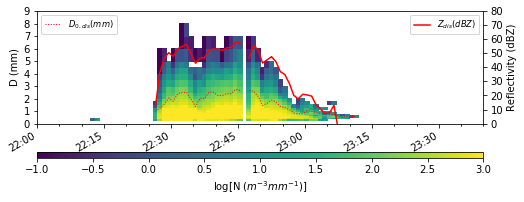

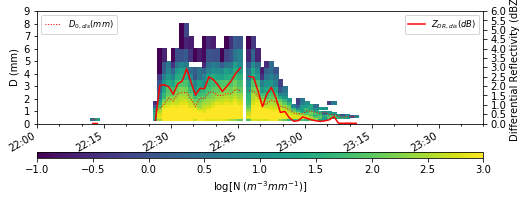

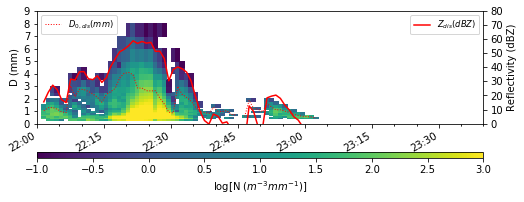

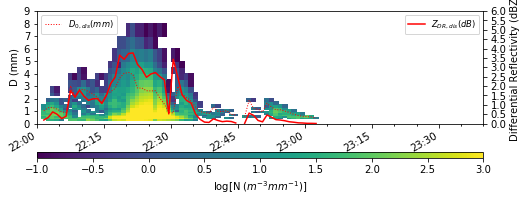

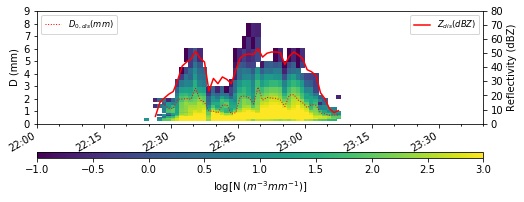

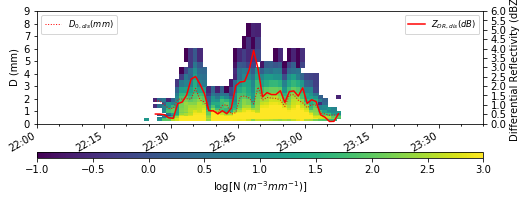

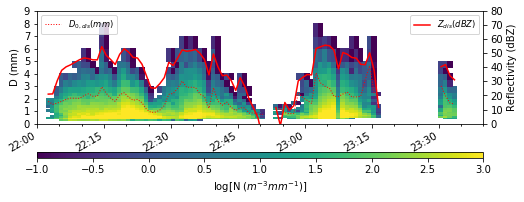

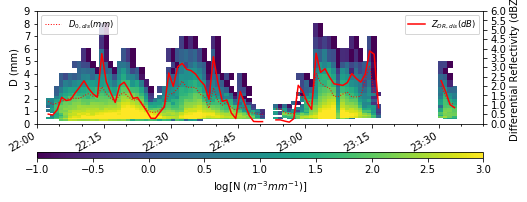

In [106]:
# Plot observed DSD meteograms interpolated to model times
# Get PSD times valid at the model times
PSD_datetimes_model = pips.get_PSD_datetimes(var_ds, dim_name='time')
PSD_datetimes_model_dict = pips.get_PSD_time_bins(PSD_datetimes_model)
PSDstarttimes = dates.date2num(PSD_datetimes_model_dict['PSD_datetimes_edges'])
PSDmidtimes = dates.date2num(PSD_datetimes_model_dict['PSD_datetimes_centers'])

# Prepare axis parameters
# We'll use the model times for the boundaries of the x-axis
timelimits = [datetime_range[0], datetime_range[-1]]
diamlimits = [0.0, 9.0]
diamytick = 1.0
DSDtype = 'observed'
locator = dates.MinuteLocator(byminute=[0,15,30,45])
minorlocator = dates.MinuteLocator(byminute=range(0,60,5))
dateformat = '%H:%M'
formatter = dates.DateFormatter(dateformat)

axparams = {'majorxlocator': locator, 'majorxformatter': formatter,
            'minorxlocator': minorlocator,
            'axeslimits': [timelimits, diamlimits],
            'majorylocator': ticker.MultipleLocator(base=diamytick),
            'axeslabels': [None, 'D (mm)']}

# Ok, now we should have everything ready to go to plot the meteograms.
# Let'er rip!
for i, dis_name in enumerate(dis_names):
    logND = logND_interp_to_model_times_dict[dis_name]
    D0 = D0_PIPS_interp_to_model_times_dict[dis_name] * 1000. # Get to mm again
    dBZ = dBZ_PIPS_interp_to_model_times_dict[dis_name]
    ZDR = dualpol_PIPS_interp_to_model_times_dict[dis_name]['ZDR']
    
    disvars = {'min_diameter': min_diameters, 'PSDstarttimes': PSDstarttimes,
               'PSDmidtimes': PSDmidtimes, 'logND': logND.T, 'D_0': D0, 'dBZ': dBZ, 'ZDR': ZDR}
    
    dis_plot_name = dis_name + '_interp_to_model_' + DSDtype
    PIPSplot.plotDSDmeteograms(dis_plot_name, meteogram_plotdir, axparams, disvars, close_fig=False)

In [109]:
# Compute N(D) from the raw model parameters at original model times

ND_model_raw_PIPS_dict_list = []
ND_model_raw_combined_list = []
logND_model_raw_PIPS_dict_list = []

for alphar_model_allPIPS_da, lamdar_model_allPIPS_da, N0r_model_allPIPS_da in \
        zip(alphar_model_allPIPS_da_list, lamdar_model_allPIPS_da_list, N0r_model_allPIPS_da_list):

    ND_model_raw_PIPS_dict = {}
    logND_model_raw_PIPS_dict = {}
    for i, dis_name in enumerate(dis_names):
        mid_diameters_da = vd_matrix_da_dict[dis_name]['diameter']
        alphar_model_PIPS_da = alphar_model_allPIPS_da.loc[dict(PIPS=dis_name)]
        N0r_model_PIPS_da = N0r_model_allPIPS_da.loc[dict(PIPS=dis_name)]
        lamdar_model_PIPS_da = lamdar_model_allPIPS_da.loc[dict(PIPS=dis_name)]
#         if i == 0:
#             print(mid_diameters_da, alphar_model_PIPS_da)
        # Broadcast DSD parameter DataArrays to get everyone on the same dimensional page
        mid_diameters_da, N0r_model_PIPS_da, lamdar_model_PIPS_da, alphar_model_PIPS_da = \
            xr.broadcast(mid_diameters_da, N0r_model_PIPS_da, lamdar_model_PIPS_da, alphar_model_PIPS_da)
#         if i == 0:
#             print(mid_diameters_da, alphar_model_PIPS_da)
        # Transpose these DataArrays to get time as the first dimension
        mid_diameters_da = mid_diameters_da.T
        N0r_model_PIPS_da = N0r_model_PIPS_da.T
        lamdar_model_PIPS_da = lamdar_model_PIPS_da.T
        alphar_model_PIPS_da = alphar_model_PIPS_da.T

        ND_model_raw_PIPS = dsd.calc_binned_DSD_from_params(N0r_model_PIPS_da, lamdar_model_PIPS_da, 
                                                            alphar_model_PIPS_da, mid_diameters_da)
        logND_model_raw_PIPS = np.log10(ND_model_raw_PIPS)
        logND_model_raw_PIPS = logND_model_raw_PIPS.where(logND_model_raw_PIPS > -np.inf)

        ND_model_raw_PIPS_dict[dis_name] = ND_model_raw_PIPS
        logND_model_raw_PIPS_dict[dis_name] = logND_model_raw_PIPS
    
    # Concat along PIPS dimension
    ND_model_raw_list = [ND_model_raw_PIPS_dict[dis_name].reset_coords(drop=True) 
                         for dis_name in dis_names]
    ND_model_raw_combined = xr.concat(ND_model_raw_list, dim='PIPS')
        
    ND_model_raw_PIPS_dict_list.append(ND_model_raw_PIPS_dict)
    logND_model_raw_PIPS_dict_list.append(logND_model_raw_PIPS_dict)
    ND_model_raw_combined_list.append(ND_model_raw_combined)

# Combine ND dataarrays along member dimension

ND_model_raw_combined_da = xr.concat(ND_model_raw_combined_list, dim='member')

print(ND_model_raw_combined_da)

/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)
/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)
/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)
/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)
/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)
/home/dawson29/

/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)
/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)
/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)
/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)
/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)
/home/dawson29/

<xarray.DataArray (member: 36, PIPS: 4, time: 101, diameter_bin: 32)>
array([[[[3.381922e-01, ..., 7.806151e-48],
         ...,
         [5.895098e+01, ..., 5.131702e-60]],

        ...,

        [[1.656202e+01, ..., 1.852359e-46],
         ...,
         [9.748859e+02, ..., 2.610988e-28]]],


       ...,


       [[[1.012560e+02, ..., 7.614706e-36],
         ...,
         [9.372622e+01, ..., 8.657225e-58]],

        ...,

        [[1.502128e-17, ..., 0.000000e+00],
         ...,
         [9.390363e+02, ..., 2.847881e-25]]]])
Coordinates:
  * time     (time) datetime64[ns] 2016-03-31T22:00:00 ... 2016-03-31T23:40:00
Dimensions without coordinates: member, PIPS, diameter_bin


/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)
/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)
/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)
/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)
/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)
/home/dawson29/

In [110]:
logND_model_raw_combined_da = np.log10(ND_model_raw_combined_da)
logND_model_raw_combined_da = logND_model_raw_combined_da.where(logND_model_raw_combined_da > -np.inf)

In [19]:
# Compute some radar and DSD parameters from the raw model DSDs (interpolated to PIPS locations but not times)
dBZ_raw_model_dict_list = []
D0_raw_model_dict_list = []
ZDR_raw_model_dict_list = []
dualpol_raw_model_dict_list = []

for ND_model_raw_PIPS_dict in ND_model_raw_PIPS_dict_list:
    dBZ_raw_model_dict = {}
    D0_raw_model_dict = {}
    ZDR_raw_model_dict = {}
    dualpol_raw_model_dict = {}
    for dis_name in dis_names:
        dBZ_raw_model = dsd.calc_dBZ_from_bins(ND_model_raw_PIPS_dict[dis_name])
        dBZ_raw_model = dBZ_raw_model.where(dBZ_raw_model > -np.inf)
        dBZ_raw_model_dict[dis_name] = dBZ_raw_model
        D0_raw_model = dsd.calc_D0_bin(ND_model_raw_PIPS_dict[dis_name])
        D0_raw_model_dict[dis_name] = D0_raw_model
        pol_raw_model_dict = pol.calpolrain(wavelength, scatt_file, ND_model_raw_PIPS_dict[dis_name], bin_width)
        dualpol_raw_model_dict[dis_name] = pol_raw_model_dict
    
    dBZ_raw_model_dict_list.append(dBZ_raw_model_dict)
    D0_raw_model_dict_list.append(D0_raw_model_dict)
    ZDR_raw_model_dict_list.append(ZDR_raw_model_dict)
    dualpol_raw_model_dict_list.append(dualpol_raw_model_dict)


/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)
/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)
/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)
/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)
/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)
/home/dawson29/

/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)
/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)
/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)
/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)
/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)
/home/dawson29/

/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)
/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)
/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)
/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)
/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)
/home/dawson29/

In [102]:
# Create a combined DataArray for all the ensemble members and then convert to a DataFrame for use in seaborn
PIPS_time_range = {
    'PIPS1A': [datetime(2016, 3, 31, 22, 5), datetime(2016, 3, 31, 23, 20)],
    'PIPS1B': [datetime(2016, 3, 31, 22, 0), datetime(2016, 3, 31, 23, 25)],
    'PIPS2A': [datetime(2016, 3, 31, 22, 20), datetime(2016, 3, 31, 23, 10)],
    'PIPS2B': [datetime(2016, 3, 31, 21, 45), datetime(2016, 3, 31, 23, 35)]
}


PIPS_to_plot = 'PIPS2B'


# D0
D0_raw_model_list = [D0_raw_model_dict[PIPS_to_plot].reset_coords(drop=True) 
                            for D0_raw_model_dict in D0_raw_model_dict_list]
D0_raw_model_combined = xr.concat(D0_raw_model_list, dim='member')
D0_raw_model_combined_df = D0_raw_model_combined.to_dataframe(name='D0')

# Reflectivity

dBZ_raw_model_list = [dBZ_raw_model_dict[PIPS_to_plot].reset_coords(drop=True) 
                            for dBZ_raw_model_dict in dBZ_raw_model_dict_list]
dBZ_raw_model_combined = xr.concat(dBZ_raw_model_list, dim='member')
dBZ_raw_model_combined_df = dBZ_raw_model_combined.to_dataframe(name='dBZ')

# ZDR

ZDR_raw_model_list = [dualpol_raw_model_dict[PIPS_to_plot]['ZDR'].reset_coords(drop=True) 
                            for dualpol_raw_model_dict in dualpol_raw_model_dict_list]
ZDR_raw_model_combined = xr.concat(ZDR_raw_model_list, dim='member')
ZDR_raw_model_combined_df = ZDR_raw_model_combined.to_dataframe(name='ZDR')

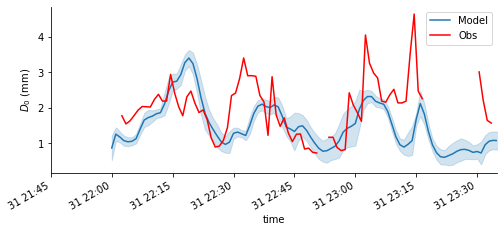

In [103]:
# Plot a timeseries of D0 with confidence intervals from the model ensemble
import seaborn as sns
plotdir = '/depot/dawson29/data/Projects/VORTEXSE/vortexse_enkf_dsd_study/plots'
meteogram_plotdir = os.path.join(plotdir, 'meteograms')
if not os.path.exists(meteogram_plotdir):
    os.makedirs(meteogram_plotdir)

PSD_datetimes_model = pips.get_PSD_datetimes(var_ds, dim_name='time')
PSD_datetimes_model_dict = pips.get_PSD_time_bins(PSD_datetimes_model)
PSDstarttimes = dates.date2num(PSD_datetimes_model_dict['PSD_datetimes_edges'])
PSDmidtimes = dates.date2num(PSD_datetimes_model_dict['PSD_datetimes_centers'])

D0_obs = D0_PIPS_interp_to_model_times_dict[PIPS_to_plot] * 1000. # Get to mm again
D0_raw_model_combined_df_test = D0_raw_model_combined_df.copy() * 1000.
D0_raw_model_combined_df_test.reset_index(inplace=True)
g = sns.relplot(x="time", y="D0", kind="line", ci="sd", data=D0_raw_model_combined_df_test, label='Model')
g.fig.set_size_inches(8., 3., forward = True)
g.fig.autofmt_xdate()
g.set_ylabels(r'$D_0$ (mm)')
g.ax.plot(PSDmidtimes, D0_obs, 'r', label='Obs')
plt.legend(loc='best')
g.ax.set_xlim(PIPS_time_range[PIPS_to_plot])

figname = '{}_model_obs_D0.png'.format(PIPS_to_plot)
figpath = os.path.join(meteogram_plotdir, figname)
plt.savefig(figpath, dpi=300, bbox_inches='tight')


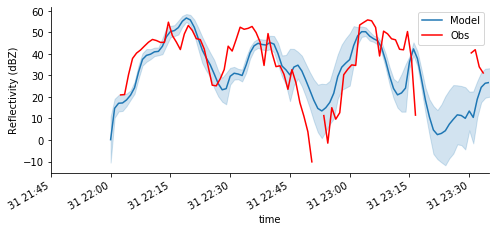

In [104]:
# Reflectivity
dBZ_obs = dBZ_PIPS_interp_to_model_times_dict[PIPS_to_plot]
dBZ_raw_model_combined_df_test = dBZ_raw_model_combined_df.copy()
dBZ_raw_model_combined_df_test.reset_index(inplace=True)
g = sns.relplot(x="time", y="dBZ", kind="line", ci="sd", data=dBZ_raw_model_combined_df_test, label='Model')
g.fig.set_size_inches(8., 3., forward = True)
g.fig.autofmt_xdate()
g.set_ylabels(r'Reflectivity (dBZ)')
g.ax.plot(PSDmidtimes, dBZ_obs, 'r', label='Obs')
plt.legend(loc='best')
g.ax.set_xlim(PIPS_time_range[PIPS_to_plot])

figname = '{}_model_obs_dBZ.png'.format(PIPS_to_plot)
figpath = os.path.join(meteogram_plotdir, figname)
plt.savefig(figpath, dpi=300, bbox_inches='tight')

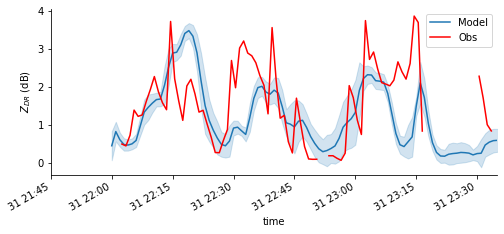

In [105]:
# ZDR
ZDR_obs = dualpol_PIPS_interp_to_model_times_dict[PIPS_to_plot]['ZDR']
ZDR_raw_model_combined_df_test = ZDR_raw_model_combined_df.copy()
ZDR_raw_model_combined_df_test.reset_index(inplace=True)
g = sns.relplot(x="time", y="ZDR", kind="line", ci="sd", data=ZDR_raw_model_combined_df_test, label='Model')
g.fig.set_size_inches(8., 3., forward = True)
g.fig.autofmt_xdate()
g.set_ylabels(r'$Z_{DR}$ (dB)')
g.ax.plot(PSDmidtimes, ZDR_obs, 'r', label='Obs')
plt.legend(loc='best')
g.ax.set_xlim(PIPS_time_range[PIPS_to_plot])

figname = '{}_model_obs_ZDR.png'.format(PIPS_to_plot)
figpath = os.path.join(meteogram_plotdir, figname)
plt.savefig(figpath, dpi=300, bbox_inches='tight')

/home/dawson29/Projects/pyPIPS/pyPIPS/plotmodule.py:741: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(figsize=(8, 3))


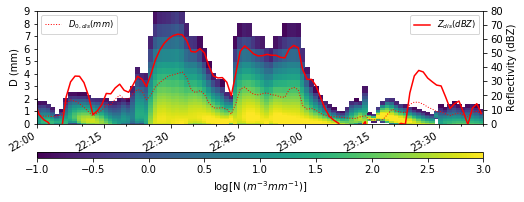

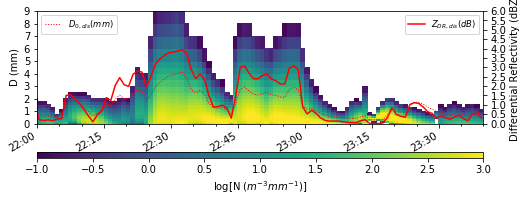

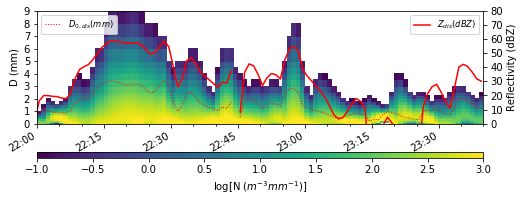

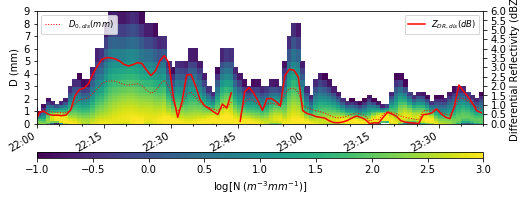

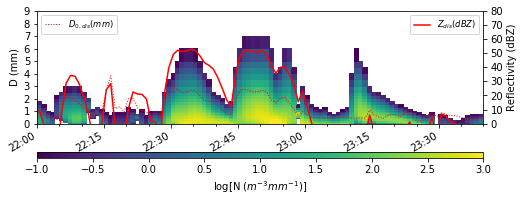

...

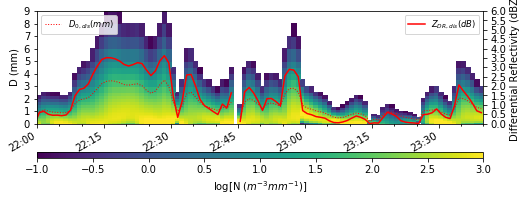

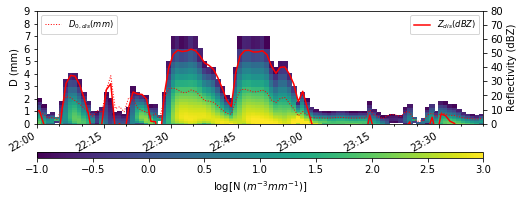

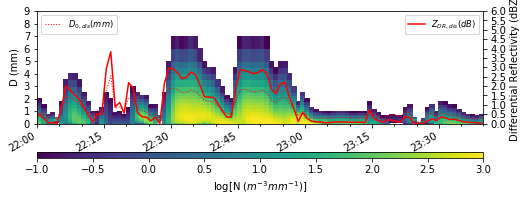

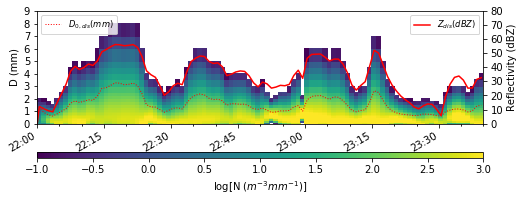

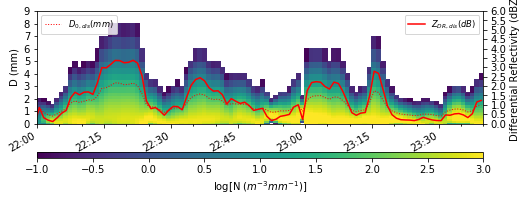

In [116]:
# Now plot the raw model DSDs (interpolated to PIPS locations but not the times)

PSDstarttimes = dates.date2num(PSD_datetimes_model_dict['PSD_datetimes_edges'])
PSDmidtimes = dates.date2num(PSD_datetimes_model_dict['PSD_datetimes_centers'])

for member, logND_model_raw_PIPS_dict in enumerate(logND_model_raw_PIPS_dict_list):
    for i, dis_name in enumerate(dis_names):
        logND = logND_model_raw_PIPS_dict[dis_name]
        logND = logND.where(logND > -1.0)
        D0 = D0_raw_model_dict[dis_name] * 1000. # Get to mm again
        dBZ = dBZ_raw_model_dict[dis_name]
        ZDR = dualpol_raw_model_dict[dis_name]['ZDR']
        disvars = {'min_diameter': min_diameters, 'PSDstarttimes': PSDstarttimes,
                   'PSDmidtimes': PSDmidtimes, 'logND': logND.T, 'D_0': D0, 'dBZ': dBZ, 'ZDR': ZDR}
        dis_plot_name = dis_name + '_raw_model_member_{:02d}_'.format(member+1) + DSDtype
        PIPSplot.plotDSDmeteograms(dis_plot_name, meteogram_plotdir, axparams, disvars, close_fig=False)

No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


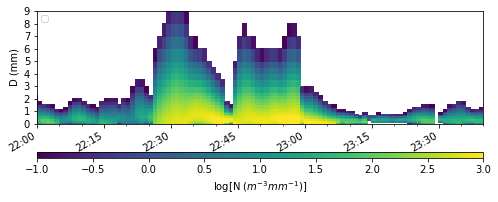

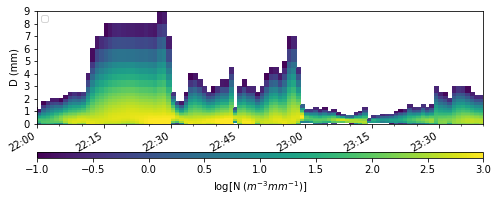

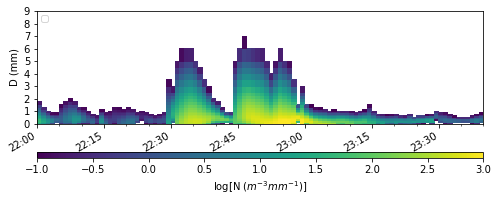

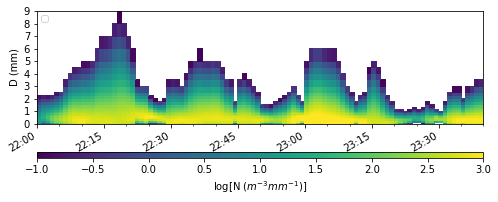

In [117]:
# Now plot the mean raw model DSDs (interpolated to PIPS locations but not the times)

PSDstarttimes = dates.date2num(PSD_datetimes_model_dict['PSD_datetimes_edges'])
PSDmidtimes = dates.date2num(PSD_datetimes_model_dict['PSD_datetimes_centers'])

for i, dis_name in enumerate(dis_names):
    logND_all = logND_model_raw_combined_da.isel(PIPS=i)
    logND_mean = logND_all.mean(dim='member')
    logND_mean = logND_mean.where(logND_mean > -1.0)
#     D0 = D0_raw_model_dict[dis_name] * 1000. # Get to mm again
#     dBZ = dBZ_raw_model_dict[dis_name]
#     ZDR = dualpol_raw_model_dict[dis_name]['ZDR']
#     disvars = {'min_diameter': min_diameters, 'PSDstarttimes': PSDstarttimes,
#                'PSDmidtimes': PSDmidtimes, 'logND': logND.T, 'D_0': D0, 'dBZ': dBZ, 'ZDR': ZDR}
    disvars = {'min_diameter': min_diameters, 'PSDstarttimes': PSDstarttimes,
               'PSDmidtimes': PSDmidtimes, 'logND': logND_mean.T}
    dis_plot_name = dis_name + '_raw_model_member_mean_' + DSDtype
    PIPSplot.plotDSDmeteograms(dis_plot_name, meteogram_plotdir, axparams, disvars, close_fig=False)

In [115]:
# Now compute sampled PSDs from the model
DSDtype = 'observed'
# Now plot the sampled model DSD

sampling_interval = 60.
sampling_length = pp.parsivel_parameters['sensor_length_mm'] / 1000. # To m
sampling_width = pp.parsivel_parameters['sensor_width_mm'] / 1000. # To m

Dmax = 9.
Dmax_index = np.searchsorted(mid_diameters, Dmax, side='right')
# print(Dmax_index)
mid_diameters_trunc = np.array(mid_diameters[:Dmax_index+1]) / 1000.
min_diameters_trunc = np.array(min_diameters[:Dmax_index+1]) / 1000.
max_diameters_trunc = np.array(max_diameters[:Dmax_index+1]) / 1000.

PSDstarttimes = dates.date2num(PSD_datetimes_model_dict['PSD_datetimes_edges'])
PSDmidtimes = dates.date2num(PSD_datetimes_model_dict['PSD_datetimes_centers'])

D0_sample_dict_list = []
ND_sample_dict_list = []
dBZ_sample_dict_list = []
dualpol_sample_dict_list = []

for member, var_ds_interp in enumerate(var_ds_interp_list):

    D0_sample_dict = {}
    ND_sample_dict = {}
    dBZ_sample_dict = {}
    dualpol_sample_dict = {}

    for dis_name in dis_names:
        nr_model = var_ds_interp['nr'].loc[dict(PIPS=dis_name)].values
        lamdar_model = var_ds_interp['lamdar'].loc[dict(PIPS=dis_name)].values
        alphar_model = var_ds_interp['alphar'].loc[dict(PIPS=dis_name)].values
        rho_model = var_ds_interp['rho'].loc[dict(PIPS=dis_name)].values

        # print(mid_diameters_trunc.shape)
        Vtr = pips.calc_empirical_fallspeed(mid_diameters_trunc * 1000., correct_rho=True, rho=rho_model)

        Vtr = Vtr.T
    #     print(Vtr[0])
    #     print(Vtr.shape)
    #     print(mid_diameters_trunc.shape)
        ND_samp_series = np.zeros((np.size(PSDmidtimes), np.size(mid_diameters_trunc)))

    #     print(ND_samp_series.shape)
    #     print(nr_model[0])
        # Nc_bin_tmp2 = np.zeros((np.size(N0r), np.size(D[:Dmax_index+1])))
        # Nc_bin2 = np.zeros((np.size(np.array(sampling_times)), np.size(D[:Dmax_index+1])))

        all_valid = (not np.isnan(lamdar_model[0]) and (not np.isnan(alphar_model[0])) and (not np.isnan(nr_model[0])))
        if all_valid:
            # Special treatment for first sampling time. Just assume DSD valid at that time was constant for the previous 
            # sampling interval
            sample_dict = sim.create_random_gamma_DSD(nr_model[0], lamdar_model[0], 
                                                      alphar_model[0], Vtr[0], sampling_length, 
                                                      sampling_width, min_diameters_trunc, mid_diameters_trunc, 
                                                      max_diameters_trunc, Dmax=Dmax, sampling_interval=sampling_interval,
                                                      remove_margins=True, rhocorrect=True, rho=rho_model[0], verbose=False)


            ND_sample = sample_dict['ND']
            pcount_binned_sample = sample_dict['pcount_binned']
        #     print(ND_sample.shape)
        #     print(ND_samp_series.shape)
            ND_samp_series[0, :] = 1.e-3*ND_sample
            # Nc_bin_tmp2[0, :] = 1.e-3*ND_sample
            # Nc_bin2[0, :] = Nc_bin_tmp2[0, :]


        pcount_binned_samples = []
        for index in range(np.size(PSDmidtimes[1:])):
            all_valid = (not np.isnan(lamdar_model[index]) 
                         and (not np.isnan(alphar_model[index]))
                         and (not np.isnan(nr_model[index])))
            # print('nr = ', nr_model[index], 'lamdar = ', lamdar_model[index], 'alphar = ', alphar_model[index])
            if all_valid:
                sample_dict = sim.create_random_gamma_DSD(nr_model[index], lamdar_model[index], 
                                                          alphar_model[index], Vtr[index], sampling_length, 
                                                          sampling_width, min_diameters_trunc, mid_diameters_trunc, 
                                                          max_diameters_trunc, Dmax=Dmax, sampling_interval=sampling_interval,
                                                          remove_margins=True, rhocorrect=True, rho=rho_model[index], verbose=False)
                ND_sample = sample_dict['ND']
                pcount_binned_samples.append(sample_dict['pcount_binned'])
                ND_samp_series[index, :] = 1.e-3*ND_sample
            else:
                pcount_binned_samples.append(np.zeros(np.size(mid_diameters_trunc)+1))
                #pcount_binned_samples.append(np.zeros_like(sample_dict['pcount_binned']))

        pcount_binned_samples = np.array(pcount_binned_samples)

        ND_samp_da = xr.DataArray(ND_samp_series,
                                         coords={'time': PSD_datetimes_model_dict['PSD_datetimes_edges'][:-1],
                                                 'diameter': ('diameter_bin', mid_diameters_trunc * 1000.),
                                                 'max_diameter': ('diameter_bin', max_diameters_trunc * 1000.),
                                                 'min_diameter': ('diameter_bin', min_diameters_trunc * 1000.)
                                                },
                                         dims=['time', 'diameter_bin'])

        ND_samp_da = ND_samp_da.fillna(0.0)

        # sampling_volumes_D = sim.calc_sampling_volumes_D(Vtr, Dr, Dmax, sampling_interval, sampling_area)
        # for s, sample_index in enumerate(sample_indices[:-1]):
        #     sample_index_end = sample_indices[s+1]
        #     current_sample_indices = slice(sample_index, sample_index_end, None)
        #     pcount_binned = np.sum(pcount_binned_samples[current_sample_indices], axis=0)
        #     Nc_bin2[s+1, :] = 1.e-3*sim.calc_ND(pcount_binned, sampling_volumes_D, Dr, Dl, Dmax)
        # #     Nc_bin2[s+1, :] = np.sum(Nc_bin_tmp2[current_sample_indices, :]*dt[current_sample_indices, None], axis = 0)/sampling_interval
        # #     print "s = ", s
        # #     print "sample time (beginning) = ", sampling_times[s]
        # #     print "sample time (end) = ", sampling_times[s+1]
        # #     print "dt[current_sample_indices] = ", dt[current_sample_indices]
        # #     print "Nc_bin_tmp = ", Nc_bin_tmp[current_sample_indices, :], dt[current_sample_indices]
        # #     print "Nc_bin = ", Nc_bin[s+1, :]

        logND_samp_da = np.log10(ND_samp_da)
        logND_samp_da = logND_samp_da.where(logND_samp_da > -1.0)

        # Compute dBZ and D0 from the sampled DSD
        dBZ_samp_model = dsd.calc_dBZ_from_bins(ND_samp_da)
        dBZ_samp_model = dBZ_samp_model.where(dBZ_samp_model > -np.inf)
        D0_samp_model = dsd.calc_D0_bin(ND_samp_da) * 1000. # Get to mm again
        pol_samp_model_dict = pol.calpolrain(wavelength, scatt_file, ND_samp_da, bin_width)

        dBZ_sample_dict[dis_name] = dBZ_samp_model
        D0_sample_dict[dis_name] = D0_samp_model
        dualpol_sample_dict[dis_name] = pol_samp_model_dict
        ND_sample_dict[dis_name] = ND_samp_da

        disvars = {'min_diameter': min_diameters[:Dmax_index+1], 'PSDstarttimes': PSDstarttimes,
                   'PSDmidtimes': PSDmidtimes, 'logND': logND_samp_da.T, 'D_0': D0_samp_model, 
                   'dBZ': dBZ_samp_model, 'ZDR': pol_samp_model_dict['ZDR']}
        dis_plot_name = dis_name + '_sampled_model_member_{:02d}_'.format(member+1) + DSDtype
        PIPSplot.plotDSDmeteograms(dis_plot_name, meteogram_plotdir, axparams, disvars, close_fig=True)
    
    D0_sample_dict_list.append(D0_sample_dict)
    ND_sample_dict_list.append(ND_sample_dict)
    dBZ_sample_dict_list.append(dBZ_sample_dict)
    dualpol_sample_dict_list.append(dualpol_sample_dict)
    

(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)


/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)
/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)


(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)


/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)
/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)


(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)


/home/dawson29/Projects/pyPIPS/pyPIPS/simulator.py:51: RuntimeWarning: divide by zero encountered in double_scalars
  scale = 1. / lamda
/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)
/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)


(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)


/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)
/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)


(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)


/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)
/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)


(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)


/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)
/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)


(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)


/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)
/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)


(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)


/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)
/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)


(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)


/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)
/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)


(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)


/home/dawson29/Projects/pyPIPS/pyPIPS/simulator.py:51: RuntimeWarning: divide by zero encountered in double_scalars
  scale = 1. / lamda
/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)
/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)


(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)


/home/dawson29/Projects/pyPIPS/pyPIPS/simulator.py:51: RuntimeWarning: divide by zero encountered in double_scalars
  scale = 1. / lamda
/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)
/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)


(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)


/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)
/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)


(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)


/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)
/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)


(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)


/home/dawson29/Projects/pyPIPS/pyPIPS/simulator.py:51: RuntimeWarning: divide by zero encountered in double_scalars
  scale = 1. / lamda
/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)
/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)


(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)


/home/dawson29/Projects/pyPIPS/pyPIPS/simulator.py:51: RuntimeWarning: divide by zero encountered in double_scalars
  scale = 1. / lamda
/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)
/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)


(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)


/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)
/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)


(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)


/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)
/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)


(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)


/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)
/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)


(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)


/home/dawson29/Projects/pyPIPS/pyPIPS/simulator.py:51: RuntimeWarning: divide by zero encountered in double_scalars
  scale = 1. / lamda
/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)
/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)


(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)


/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)
/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)


(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)


/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)
/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)


(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)


/home/dawson29/Projects/pyPIPS/pyPIPS/simulator.py:51: RuntimeWarning: divide by zero encountered in double_scalars
  scale = 1. / lamda
/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)
/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)


(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)


/home/dawson29/Projects/pyPIPS/pyPIPS/simulator.py:51: RuntimeWarning: divide by zero encountered in double_scalars
  scale = 1. / lamda
/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)
/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)


(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)


/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)
/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)


(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)


/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)
/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)


(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)


/home/dawson29/Projects/pyPIPS/pyPIPS/simulator.py:51: RuntimeWarning: divide by zero encountered in double_scalars
  scale = 1. / lamda
/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)
/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)


(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)


/home/dawson29/Projects/pyPIPS/pyPIPS/simulator.py:51: RuntimeWarning: divide by zero encountered in double_scalars
  scale = 1. / lamda
/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)
/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)


(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)


/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)
/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)


(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)


/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)
/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)


(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)


/home/dawson29/Projects/pyPIPS/pyPIPS/simulator.py:51: RuntimeWarning: divide by zero encountered in double_scalars
  scale = 1. / lamda
/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)
/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)


(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)


/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)
/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)


(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)


/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)
/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)


(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)


/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)
/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)


(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)


/home/dawson29/Projects/pyPIPS/pyPIPS/simulator.py:51: RuntimeWarning: divide by zero encountered in double_scalars
  scale = 1. / lamda
/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)
/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)


(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)


/home/dawson29/Projects/pyPIPS/pyPIPS/simulator.py:51: RuntimeWarning: divide by zero encountered in double_scalars
  scale = 1. / lamda
/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)
/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)


(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)


/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)
/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)


(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)


/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)
/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)


(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)


/home/dawson29/Projects/pyPIPS/pyPIPS/simulator.py:51: RuntimeWarning: divide by zero encountered in double_scalars
  scale = 1. / lamda
/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)
/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)


(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)


/home/dawson29/Projects/pyPIPS/pyPIPS/simulator.py:51: RuntimeWarning: divide by zero encountered in double_scalars
  scale = 1. / lamda
/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)
/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)


(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)


/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)
/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)


(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)


/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)
/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)


(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)


/home/dawson29/Projects/pyPIPS/pyPIPS/simulator.py:51: RuntimeWarning: divide by zero encountered in double_scalars
  scale = 1. / lamda
/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)
/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)


(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)


/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)
/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)


(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)


/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)
/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)


(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)


/home/dawson29/Projects/pyPIPS/pyPIPS/simulator.py:51: RuntimeWarning: divide by zero encountered in double_scalars
  scale = 1. / lamda
/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)
/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)


(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)


/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)
/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)


(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)


/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)
/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)


(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)


/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)
/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)


(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)


/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)
/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)


(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)


/home/dawson29/Projects/pyPIPS/pyPIPS/simulator.py:51: RuntimeWarning: divide by zero encountered in double_scalars
  scale = 1. / lamda
/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)
/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)


(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)


/home/dawson29/Projects/pyPIPS/pyPIPS/simulator.py:51: RuntimeWarning: divide by zero encountered in double_scalars
  scale = 1. / lamda
/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)
/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)


(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)


/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)
/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)


(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)


/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)
/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)


(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)


/home/dawson29/Projects/pyPIPS/pyPIPS/simulator.py:51: RuntimeWarning: divide by zero encountered in double_scalars
  scale = 1. / lamda
/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)
/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)


(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)


/home/dawson29/Projects/pyPIPS/pyPIPS/simulator.py:51: RuntimeWarning: divide by zero encountered in double_scalars
  scale = 1. / lamda
/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)
/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)


(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)


/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)
/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)


(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)


/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)
/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)


(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)


/home/dawson29/Projects/pyPIPS/pyPIPS/simulator.py:51: RuntimeWarning: divide by zero encountered in double_scalars
  scale = 1. / lamda
/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)
/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)


(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)


/home/dawson29/Projects/pyPIPS/pyPIPS/simulator.py:51: RuntimeWarning: divide by zero encountered in double_scalars
  scale = 1. / lamda
/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)
/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)


(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)


/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)
/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)


(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)


/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)
/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)


(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)


/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)
/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)


(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)


/home/dawson29/Projects/pyPIPS/pyPIPS/simulator.py:51: RuntimeWarning: divide by zero encountered in double_scalars
  scale = 1. / lamda
/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)
/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)


(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)


/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)
/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)


(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)


/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)
/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)


(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)


/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)
/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)


(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)


/home/dawson29/Projects/pyPIPS/pyPIPS/simulator.py:51: RuntimeWarning: divide by zero encountered in double_scalars
  scale = 1. / lamda
/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)
/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)


(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)


/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)
/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)


(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)


/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)
/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)


(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)


/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)
/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)


(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)


/home/dawson29/Projects/pyPIPS/pyPIPS/simulator.py:51: RuntimeWarning: divide by zero encountered in double_scalars
  scale = 1. / lamda
/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)
/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)


(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)


/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)
/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)


(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)


/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)
/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)


(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)


/home/dawson29/Projects/pyPIPS/pyPIPS/simulator.py:51: RuntimeWarning: divide by zero encountered in double_scalars
  scale = 1. / lamda
/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)
/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)


(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)


/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)
/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)


(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)


/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)
/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)


(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)


/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)
/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)


(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)


/home/dawson29/Projects/pyPIPS/pyPIPS/simulator.py:51: RuntimeWarning: divide by zero encountered in double_scalars
  scale = 1. / lamda
/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)
/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)


(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)


/home/dawson29/Projects/pyPIPS/pyPIPS/simulator.py:51: RuntimeWarning: divide by zero encountered in double_scalars
  scale = 1. / lamda
/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)
/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)


(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)


/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)
/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)


(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)


/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)
/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)


(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)


/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)
/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)


(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)


/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)
/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)


(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)


/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)
/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)


(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)


/home/dawson29/Projects/pyPIPS/pyPIPS/simulator.py:51: RuntimeWarning: divide by zero encountered in double_scalars
  scale = 1. / lamda
/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)
/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)


(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)


/home/dawson29/Projects/pyPIPS/pyPIPS/simulator.py:51: RuntimeWarning: divide by zero encountered in double_scalars
  scale = 1. / lamda
/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)
/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)


(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)


/home/dawson29/Projects/pyPIPS/pyPIPS/simulator.py:51: RuntimeWarning: divide by zero encountered in double_scalars
  scale = 1. / lamda
/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)
/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)


(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)


/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)
/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)


(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)


/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)
/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)


(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)


/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)
/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)


(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)


/home/dawson29/Projects/pyPIPS/pyPIPS/simulator.py:51: RuntimeWarning: divide by zero encountered in double_scalars
  scale = 1. / lamda
/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)
/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)


(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)


/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)
/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)


(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)


/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)
/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)


(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)


/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)
/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)


(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)


/home/dawson29/Projects/pyPIPS/pyPIPS/simulator.py:51: RuntimeWarning: divide by zero encountered in double_scalars
  scale = 1. / lamda
/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)
/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)


(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)


/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)
/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)


(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)


/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)
/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)


(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)


/home/dawson29/Projects/pyPIPS/pyPIPS/simulator.py:51: RuntimeWarning: divide by zero encountered in double_scalars
  scale = 1. / lamda
/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)
/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)


(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)


/home/dawson29/Projects/pyPIPS/pyPIPS/simulator.py:51: RuntimeWarning: divide by zero encountered in double_scalars
  scale = 1. / lamda
/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)
/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)


(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)


/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)
/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)


(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)


/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)
/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)


(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)


/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)
/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)


(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)


/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)
/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)


(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)


/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)
/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)


(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)


/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)
/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)


(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)


/home/dawson29/Projects/pyPIPS/pyPIPS/simulator.py:51: RuntimeWarning: divide by zero encountered in double_scalars
  scale = 1. / lamda
/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)
/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)


(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)


/home/dawson29/Projects/pyPIPS/pyPIPS/simulator.py:51: RuntimeWarning: divide by zero encountered in double_scalars
  scale = 1. / lamda
/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)
/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)


(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)


/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)
/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)


(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)


/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)
/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)


(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)


/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)
/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)


(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)


/home/dawson29/Projects/pyPIPS/pyPIPS/simulator.py:51: RuntimeWarning: divide by zero encountered in double_scalars
  scale = 1. / lamda
/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)
/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)


(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)


/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)
/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)


(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)


/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)
/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)


(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)


/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)
/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)


(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)


/home/dawson29/Projects/pyPIPS/pyPIPS/simulator.py:51: RuntimeWarning: divide by zero encountered in double_scalars
  scale = 1. / lamda
/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)
/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)


(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)


/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)
/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)


(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)


/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)
/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)


(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)


/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)
/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)


(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)


/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)
/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)


(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)


/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)
/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)


(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)


/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)
/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)


(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)


/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)
/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)


(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)


/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)
/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)


(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)


/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)
/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)


(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)


/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)
/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)


(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)


/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)
/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)


(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)


/home/dawson29/Projects/pyPIPS/pyPIPS/simulator.py:51: RuntimeWarning: divide by zero encountered in double_scalars
  scale = 1. / lamda
/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)
/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)


(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)


/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)
/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)


(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)


/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)
/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)


(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)


/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)
/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)


(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)


/home/dawson29/Projects/pyPIPS/pyPIPS/simulator.py:51: RuntimeWarning: divide by zero encountered in double_scalars
  scale = 1. / lamda
/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)
/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)


(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)


/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)
/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)


(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)


/home/dawson29/Projects/pyPIPS/pyPIPS/simulator.py:51: RuntimeWarning: divide by zero encountered in double_scalars
  scale = 1. / lamda
/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)
/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)


(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)


/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)
/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)


(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)


/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)
/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)


(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)


/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)
/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)


(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)


/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)
/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)


(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)


/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)
/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)


(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)


/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)
/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)


(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)


/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)
/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)


(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)


/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)
/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)


(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)


/home/dawson29/Projects/pyPIPS/pyPIPS/simulator.py:51: RuntimeWarning: divide by zero encountered in double_scalars
  scale = 1. / lamda
/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)
/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)


(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)


/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)
/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)


(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)
(26,)


/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)
/home/dawson29/.conda/envs/cent7/5.1.0-py27/pyPIPS/lib/python3.7/site-packages/xarray/core/computation.py:564: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)


KeyError: 'PIPS1B'

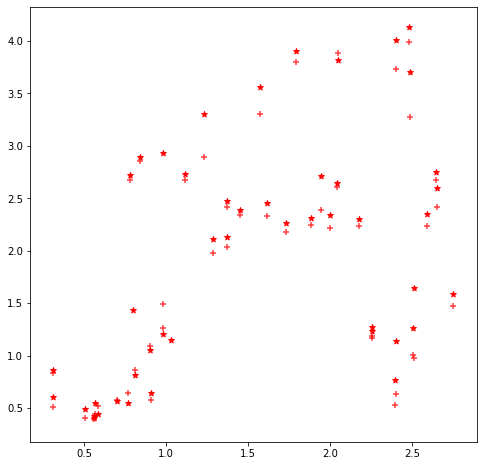

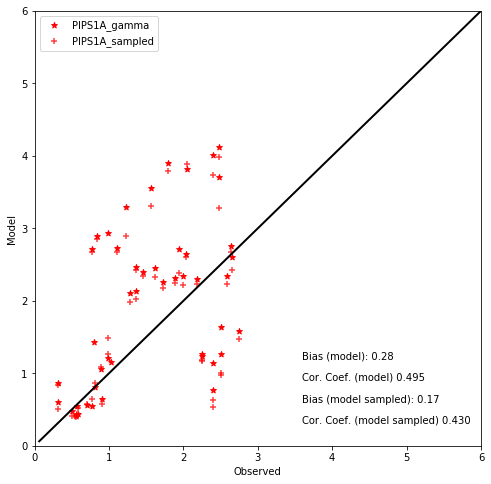

In [49]:
# Let's make some statistical comparison plots

# Make some one-to-one plots of D0 (model) vs. D0 (disdrometer)

yvals = pp.parsivel_parameters['avg_diameter_bins_mm']
xvals = yvals

color_list = ['r', 'orange', 'g', 'b']

fig_all, ax_all = plt.subplots(figsize=(8,8))

for d, dis_name in enumerate(dis_names):
    obs = D0_PIPS_interp_to_model_times_dict[dis_name] * 1000.
    mod = D0_raw_model_dict[dis_name] * 1000.
    mod_sampled = D0_sample_dict[dis_name]
    bias_mod = ((np.nansum(mod - obs)) / np.nansum(obs))
    bias_mod_sampled = ((np.nansum(mod_sampled - obs)) / np.nansum(obs))
    cc_mod = pd.DataFrame({'obs': obs, 'mod': mod}).corr().iloc[0, 1]
    cc_mod_sampled = pd.DataFrame({'obs': obs, 'mod': mod_sampled}).corr().iloc[0, 1]
    fig = plt.figure(figsize=(8,8))
    ax = fig.add_subplot(111)
    plt.scatter(obs, mod, c=color_list[d], marker='*', label=dis_name+'_gamma')
    plt.scatter(obs, mod_sampled, c=color_list[d], marker='+', alpha=0.75, label=dis_name+'_sampled')
    ax_all.scatter(obs, mod, c=color_list[d], marker='*', label=dis_name+'_gamma')
    ax_all.scatter(obs, mod_sampled, c=color_list[d], marker='+', alpha=0.75, label=dis_name+'_sampled')
    ax.plot(xvals, yvals, lw=2, color='k')
    ax.set_xlim(0.0, 6.0)
    ax.set_ylim(0.0, 6.0)
    ax.set_xlabel('Observed')
    ax.set_ylabel('Model')
    ax.text(0.6, 0.20, 'Bias (model): {:2.2f}'.format(bias_mod), transform=ax.transAxes)
    ax.text(0.6, 0.15, 'Cor. Coef. (model) {:2.3f}'.format(cc_mod), transform=ax.transAxes)
    ax.text(0.6, 0.10, 'Bias (model sampled): {:2.2f}'.format(bias_mod_sampled), transform=ax.transAxes)
    ax.text(0.6, 0.05, 'Cor. Coef. (model sampled) {:2.3f}'.format(cc_mod_sampled), transform=ax.transAxes)
    plt.legend(loc='upper left')

D0_raw_model_list = [v for k, v in D0_raw_model_dict.items()]
D0_PIPS_list = [v for k, v in D0_PIPS_interp_to_model_times_dict.items()]
D0_samp_model_list = [v for k, v in D0_sample_dict.items()]

D0r_mod = xr.concat(D0_raw_model_list, dim='PIPS') * 1000.
D0r_obs = xr.concat(D0_PIPS_list, dim='PIPS') * 1000.  
D0r_mod_samp = xr.concat(D0_samp_model_list, dim='PIPS')

bias_mod_all = ((np.nansum(D0r_mod - D0r_obs)) / np.nansum(D0r_obs))
bias_mod_samp_all = ((np.nansum(D0r_mod_samp - D0r_obs)) / np.nansum(D0r_obs))
cc_mod_all = pd.DataFrame({'obs': D0r_obs.stack(points=['PIPS', 'time']), 
                           'mod': D0r_mod.stack(points=['PIPS', 'time'])}).corr().iloc[0, 1]
cc_mod_samp_all = pd.DataFrame({'obs': D0r_obs.stack(points=['PIPS', 'time']),
                                'mod': D0r_mod_samp.stack(points=['PIPS', 'time'])}).corr().iloc[0, 1]

ax_all.plot(xvals, yvals, lw=2, color='k')
ax_all.set_xlim(0.0, 6.0)
ax_all.set_ylim(0.0, 6.0)
ax_all.set_xlabel('Observed')
ax_all.set_ylabel('Model')
ax_all.text(0.6, 0.20, 'Bias (model): {:2.2f}'.format(bias_mod_all), transform=ax_all.transAxes)
ax_all.text(0.6, 0.15, 'Cor. Coef. (model) {:2.3f}'.format(cc_mod_all), transform=ax_all.transAxes)
ax_all.text(0.6, 0.10, 'Bias (model sampled): {:2.2f}'.format(bias_mod_samp_all), transform=ax_all.transAxes)
ax_all.text(0.6, 0.05, 'Cor. Coef. (model sampled) {:2.3f}'.format(cc_mod_samp_all), transform=ax_all.transAxes)
plt.legend(loc='upper left')

KeyError: 'PIPS1B'

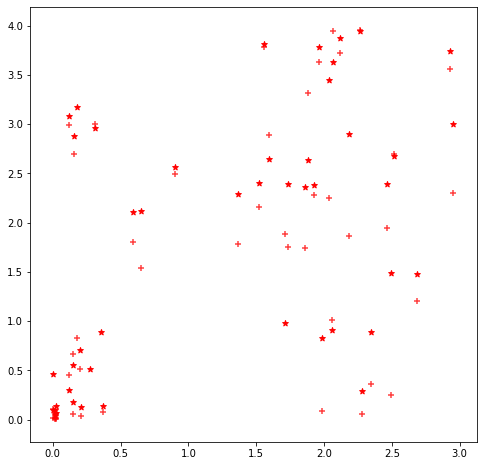

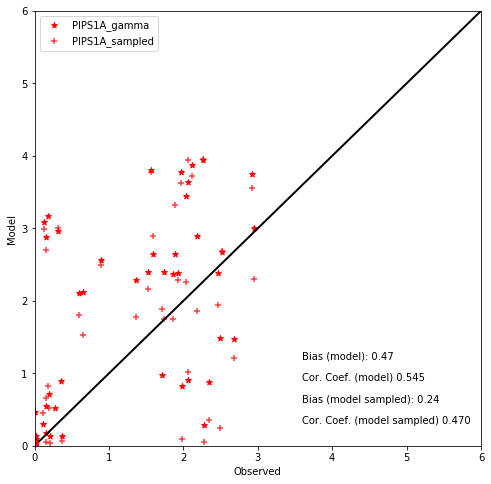

In [48]:
# Let's make some statistical comparison plots

# Make some one-to-one plots of ZDR (model) vs. ZDR (disdrometer)

yvals = pp.parsivel_parameters['avg_diameter_bins_mm']
xvals = yvals

color_list = ['r', 'orange', 'g', 'b']

fig_all, ax_all = plt.subplots(figsize=(8,8))

for d, dis_name in enumerate(dis_names):
    obs = dualpol_PIPS_interp_to_model_times_dict[dis_name]['ZDR']
    mod = dualpol_raw_model_dict[dis_name]['ZDR']
    mod_sampled = dualpol_sample_dict[dis_name]['ZDR']
    bias_mod = ((np.nansum(mod - obs)) / np.nansum(obs))
    bias_mod_sampled = ((np.nansum(mod_sampled - obs)) / np.nansum(obs))
    cc_mod = pd.DataFrame({'obs': obs, 'mod': mod}).corr().iloc[0, 1]
    cc_mod_sampled = pd.DataFrame({'obs': obs, 'mod': mod_sampled}).corr().iloc[0, 1]
    fig = plt.figure(figsize=(8,8))
    ax = fig.add_subplot(111)
    plt.scatter(obs, mod, c=color_list[d], marker='*', label=dis_name+'_gamma')
    plt.scatter(obs, mod_sampled, c=color_list[d], marker='+', alpha=0.75, label=dis_name+'_sampled')
    ax_all.scatter(obs, mod, c=color_list[d], marker='*', label=dis_name+'_gamma')
    ax_all.scatter(obs, mod_sampled, c=color_list[d], marker='+', alpha=0.75, label=dis_name+'_sampled')
    ax.plot(xvals, yvals, lw=2, color='k')
    ax.set_xlim(0.0, 6.0)
    ax.set_ylim(0.0, 6.0)
    ax.set_xlabel('Observed')
    ax.set_ylabel('Model')
    ax.text(0.6, 0.20, 'Bias (model): {:2.2f}'.format(bias_mod), transform=ax.transAxes)
    ax.text(0.6, 0.15, 'Cor. Coef. (model) {:2.3f}'.format(cc_mod), transform=ax.transAxes)
    ax.text(0.6, 0.10, 'Bias (model sampled): {:2.2f}'.format(bias_mod_sampled), transform=ax.transAxes)
    ax.text(0.6, 0.05, 'Cor. Coef. (model sampled) {:2.3f}'.format(cc_mod_sampled), transform=ax.transAxes)
    plt.legend(loc='upper left')

ZDR_raw_model_list = [v['ZDR'] for k, v in dualpol_raw_model_dict.items()]
ZDR_PIPS_list = [v['ZDR'] for k, v in dualpol_PIPS_interp_to_model_times_dict.items()]
ZDR_samp_model_list = [v['ZDR'] for k, v in dualpol_sample_dict.items()]

ZDR_mod = xr.concat(ZDR_raw_model_list, dim='PIPS')
ZDR_obs = xr.concat(ZDR_PIPS_list, dim='PIPS') 
ZDR_mod_samp = xr.concat(ZDR_samp_model_list, dim='PIPS')

bias_mod_all = ((np.nansum(ZDR_mod - ZDR_obs)) / np.nansum(ZDR_obs))
bias_mod_samp_all = ((np.nansum(ZDR_mod_samp - ZDR_obs)) / np.nansum(ZDR_obs))
cc_mod_all = pd.DataFrame({'obs': ZDR_obs.stack(points=['PIPS', 'time']), 
                           'mod': ZDR_mod.stack(points=['PIPS', 'time'])}).corr().iloc[0, 1]
cc_mod_samp_all = pd.DataFrame({'obs': ZDR_obs.stack(points=['PIPS', 'time']),
                                'mod': ZDR_mod_samp.stack(points=['PIPS', 'time'])}).corr().iloc[0, 1]

ax_all.plot(xvals, yvals, lw=2, color='k')
ax_all.set_xlim(0.0, 6.0)
ax_all.set_ylim(0.0, 6.0)
ax_all.set_xlabel('Observed')
ax_all.set_ylabel('Model')
ax_all.text(0.6, 0.20, 'Bias (model): {:2.2f}'.format(bias_mod_all), transform=ax_all.transAxes)
ax_all.text(0.6, 0.15, 'Cor. Coef. (model) {:2.3f}'.format(cc_mod_all), transform=ax_all.transAxes)
ax_all.text(0.6, 0.10, 'Bias (model sampled): {:2.2f}'.format(bias_mod_samp_all), transform=ax_all.transAxes)
ax_all.text(0.6, 0.05, 'Cor. Coef. (model sampled) {:2.3f}'.format(cc_mod_samp_all), transform=ax_all.transAxes)
plt.legend(loc='upper left')

In [ ]:
# Calculate dual-pol variables for both the model and observations and make scatterplots of Z vs. ZDR
# Z, ZDR relation from Cao et al. (2008)
Zh_Cao = np.arange(10, 61, 0.1)
Zdr_Cao = 10**((-2.6857 * 10**-4 * Zh_Cao**2) + 0.04892 * Zh_Cao - 1.4287)
color_list = ['r', 'orange', 'g', 'b']

for d, dis_name in enumerate(dis_names):
    
    
    dualpol_mod = dualpol_sample_dict[dis_name]
    dualpol_mod_raw = dualpol_raw_model_dict[dis_name]
    dualpol_obs = dualpol_PIPS_interp_to_model_times_dict[dis_name]
    fig = plt.figure(figsize=(8,8))
    ax = fig.add_subplot(111)
    sc = plt.scatter(dualpol_mod['dBZ'], dualpol_mod['ZDR'], c=color_list[d], marker='*', label=dis_name+'_mod',
                     vmin=-15000., vmax=15000.)
    sc = plt.scatter(dualpol_mod_raw['dBZ'], dualpol_mod_raw['ZDR'], c=color_list[d], marker='+', label=dis_name+'_mod_raw',
                     vmin=-15000., vmax=15000.)
    plt.scatter(dualpol_obs['dBZ'], dualpol_obs['ZDR'], c=color_list[d], marker='o', label=dis_name+'_obs', vmin=-15000., vmax=15000.)
    plt.plot(Zh_Cao, Zdr_Cao, c='k', ls='-', lw=1.0)
    #plt.colorbar(sc)
    ax.set_xlabel('dBZ')
    ax.set_ylabel(r'Z$_DR$')
    ax.set_xlim(10.0, 60.0)
    ax.set_ylim(-2.0, 6.0)
    plt.legend(loc='upper left')

In [ ]:
(D0_PIPS_interp_to_model_times_dict['PIPS2B'] * 1000).plot.hist()
(D0_raw_model_dict['PIPS2B'] * 1000.).plot.hist(alpha=0.5)
D0_sample_dict['PIPS2B'].plot.hist(alpha=0.25)

# Old cells below!

In [ ]:
# TODO: maybe it's better to try to do this the other direction: namely interpolate the ND values at the PIPS
# times, which are different for each PIPS, to the common model times.

# Now, interpolate these values at the model times to the PIPS DSD times, one PIPS at a time.
# Also get the PSD time bin edges and centers as a numpy array of python datetime objects
model_vars_PIPS_dict = {}
model_gamma_DSD_params_PIPS_modeltimes_dict = {}
model_gamma_DSD_PIPS_modeltimes_dict = {}
model_gamma_DSD_params_PIPS_dict = {}
model_gamma_DSD_PIPS_dict = {}

# Get PSD times valid at the model times
PSD_datetimes_model = pips.get_PSD_datetimes(var_ds, dim_name='time')
PSD_datetimes_model_dict = pips.get_PSD_time_bins(PSD_datetimes_model)

for dis_name in dis_names:
    
    # Get the DataArrays for individual PIPS
    
    # Velocity-diameter matrix
    vd_matrix_rs_da = vd_matrix_rs_da_dict[dis_name]
    
    # Rename "time_10s" to "time" so that we have the same dimension name as the model
    vd_matrix_rs_da = vd_matrix_rs_da.rename({'time_10s': 'time'})
    
    # Shape, intercept, and slope parameters for model DSD, already interpolated in space to each
    # PIPS location
    # New way
    
    
#     alphar_model_PIPS_da = var_ds_interp['alphar'].loc[dict(PIPS=dis_name)]
#     N0r_model_PIPS_da = var_ds_interp['N0r'].loc[dict(PIPS=dis_name)]
#     lamdar_model_PIPS_da = var_ds_interp['lamdar'].loc[dict(PIPS=dis_name)]
    
    # Do the same for ND and logND
    ND_model_PIPS_da = var_ds_interp['ND'].loc[dict(PIPS=dis_name)]
    logND_model_PIPS_da = var_ds_interp['logND'].loc[dict(PIPS=dis_name)]
    
    # Old way
    alphar_model_PIPS_da = alphar_model_allPIPS_da.loc[dict(PIPS=dis_name)]
    N0r_model_PIPS_da = N0r_model_allPIPS_da.loc[dict(PIPS=dis_name)]
    lamdar_model_PIPS_da = lamdar_model_allPIPS_da.loc[dict(PIPS=dis_name)]
    
    # Get the values of some needed variables from the model dataset, already interpolated in space to each
    # PIPS location
    
    # We just need rho and nr
    rho_model_pips_da = var_ds_interp['rho'].loc[dict(PIPS=dis_name)]
    nr_model_pips_da = var_ds_interp['nr'].loc[dict(PIPS=dis_name)]
    
    # Now interpolate the DSD parameters in time to the PIPS times, which are different for each PIPS
    
    alphar_model_PIPS_da_interp = alphar_model_PIPS_da.interp_like(vd_matrix_rs_da)
    N0r_model_PIPS_da_interp = N0r_model_PIPS_da.interp_like(vd_matrix_rs_da)
    lamdar_model_PIPS_da_interp = lamdar_model_PIPS_da.interp_like(vd_matrix_rs_da)
    
    # Do the same for ND and logND
    ND_model_PIPS_da_interp = ND_model_PIPS_da.interp_like(vd_matrix_rs_da)
    logND_model_PIPS_da_interp = logND_model_PIPS_da.interp_like(vd_matrix_rs_da)
    
    # Do the same for rho and nr
    rho_model_pips_da_interp = rho_model_pips_da.interp_like(vd_matrix_rs_da)
    nr_model_pips_da = nr_model_pips_da.interpolate_na(dim='time')
    nr_model_pips_da_interp = nr_model_pips_da.interp_like(vd_matrix_rs_da)
    
    # Stuff them into a dict of dicts (gahhh!)
    model_gamma_DSD_params_modeltimes_dict = {'alphar': alphar_model_PIPS_da,
                                              'N0r': N0r_model_PIPS_da,
                                              'lamdar': lamdar_model_PIPS_da}
    model_gamma_DSD_params_PIPS_modeltimes_dict[dis_name] = model_gamma_DSD_params_modeltimes_dict
    model_gamma_DSD_params_dict = {'alphar': alphar_model_PIPS_da_interp,
                                   'N0r': N0r_model_PIPS_da_interp,
                                   'lamdar': lamdar_model_PIPS_da_interp}
    model_gamma_DSD_params_PIPS_dict[dis_name] = model_gamma_DSD_params_dict
    
    model_gamma_DSD_modeltimes_dict = {'ND': ND_model_PIPS_da, 
                                       'logND': logND_model_PIPS_da}
    model_gamma_DSD_PIPS_modeltimes_dict[dis_name] = model_gamma_DSD_modeltimes_dict
    
    model_gamma_DSD_dict = {'ND': ND_model_PIPS_da_interp,
                            'logND': logND_model_PIPS_da_interp}
    model_gamma_DSD_PIPS_dict[dis_name] = model_gamma_DSD_dict
    
    model_vars_PIPS_dict[dis_name] = {'rho': rho_model_pips_da_interp, 'nr': nr_model_pips_da_interp}

In [ ]:
# Compute N(D) from the raw model parameters at original model times
import pyPIPS.parsivel_params as pp

ND_model_raw_PIPS_modeltimes_dict = {}
logND_model_raw_PIPS_modeltimes_dict = {}
for i, dis_name in enumerate(dis_names):
    mid_diameters_da = vd_matrix_da_dict[dis_name]['diameter']
    alphar_model_PIPS_da = model_gamma_DSD_params_PIPS_modeltimes_dict[dis_name]['alphar']
    N0r_model_PIPS_da = model_gamma_DSD_params_PIPS_modeltimes_dict[dis_name]['N0r']
    lamdar_model_PIPS_da = model_gamma_DSD_params_PIPS_modeltimes_dict[dis_name]['lamdar']
    print(alphar_model_PIPS_da)
    # Broadcast DSD parameter DataArrays to get everyone on the same dimensional page
    mid_diameters_da, N0r_model_PIPS_da, lamdar_model_PIPS_da, alphar_model_PIPS_da = \
        xr.broadcast(mid_diameters_da, N0r_model_PIPS_da, lamdar_model_PIPS_da, alphar_model_PIPS_da)
    # Transpose these DataArrays to get time as the first dimension
    mid_diameters_da = mid_diameters_da.T
    N0r_model_PIPS_da = N0r_model_PIPS_da.T
    lamdar_model_PIPS_da = lamdar_model_PIPS_da.T
    alphar_model_PIPS_da = alphar_model_PIPS_da.T
    
    ND_model_raw_PIPS = dsd.calc_binned_DSD_from_params(N0r_model_PIPS_da, lamdar_model_PIPS_da, 
                                                        alphar_model_PIPS_da, mid_diameters_da)
    logND_model_raw_PIPS = np.log10(ND_model_raw_PIPS)
    logND_model_raw_PIPS = logND_model_raw_PIPS.where(logND_model_raw_PIPS > -1.0)
    
    ND_model_raw_PIPS_modeltimes_dict[dis_name] = ND_model_raw_PIPS
    logND_model_raw_PIPS_modeltimes_dict[dis_name] = logND_model_raw_PIPS

In [ ]:
# Compute N(D) from the raw model parameters (interpolated to the PIPS times and locations)
import pyPIPS.parsivel_params as pp

ND_model_raw_PIPS_dict = {}
logND_model_raw_PIPS_dict = {}
for i, dis_name in enumerate(dis_names):
    mid_diameters_da = vd_matrix_da_dict[dis_name]['diameter']
    alphar_model_PIPS_da = model_gamma_DSD_params_PIPS_dict[dis_name]['alphar']
    N0r_model_PIPS_da = model_gamma_DSD_params_PIPS_dict[dis_name]['N0r']
    lamdar_model_PIPS_da = model_gamma_DSD_params_PIPS_dict[dis_name]['lamdar']
    # Broadcast DSD parameter DataArrays to get everyone on the same dimensional page
    mid_diameters_da, N0r_model_PIPS_da, lamdar_model_PIPS_da, alphar_model_PIPS_da = \
        xr.broadcast(mid_diameters_da, N0r_model_PIPS_da, lamdar_model_PIPS_da, alphar_model_PIPS_da)
    # Transpose these DataArrays to get time as the first dimension
    mid_diameters_da = mid_diameters_da.T
    N0r_model_PIPS_da = N0r_model_PIPS_da.T
    lamdar_model_PIPS_da = lamdar_model_PIPS_da.T
    alphar_model_PIPS_da = alphar_model_PIPS_da.T
    
    ND_model_raw_PIPS = dsd.calc_binned_DSD_from_params(N0r_model_PIPS_da, lamdar_model_PIPS_da, 
                                                        alphar_model_PIPS_da, mid_diameters_da)
    logND_model_raw_PIPS = np.log10(ND_model_raw_PIPS)
    logND_model_raw_PIPS = logND_model_raw_PIPS.where(logND_model_raw_PIPS > -1.0)
    
    ND_model_raw_PIPS_dict[dis_name] = ND_model_raw_PIPS
    logND_model_raw_PIPS_dict[dis_name] = logND_model_raw_PIPS

In [ ]:
# Compute some radar and DSD parameters from the raw model DSDs (interpolated to PIPS times and locations)
dBZ_raw_model_dict = {}
D0_raw_model_dict = {}
for dis_name in dis_names:
    dBZ_raw_model = dsd.calc_dBZ_from_bins(model_gamma_DSD_PIPS_dict[dis_name]['ND'])
    dBZ_raw_model = dBZ_raw_model.where(dBZ_raw_model > -np.inf)
    dBZ_raw_model_dict[dis_name] = dBZ_raw_model
    D0_raw_model = dsd.calc_D0_bin(model_gamma_DSD_PIPS_dict[dis_name]['ND'])
    D0_raw_model_dict[dis_name] = D0_raw_model

In [ ]:
# # Now plot the raw model DSDs (interpolated to PIPS locations but not the times)

# PSDstarttimes = dates.date2num(PSD_datetimes_model_dict['PSD_datetimes_edges'])
# PSDmidtimes = dates.date2num(PSD_datetimes_model_dict['PSD_datetimes_centers'])

# for i, dis_name in enumerate(dis_names):
#     logND = model_gamma_DSD_PIPS_modeltimes_dict[dis_name]['logND']
#     logND = logND.where(logND > -1.0)
#     disvars = {'min_diameter': min_diameters, 'PSDstarttimes': PSDstarttimes,
#                'PSDmidtimes': PSDmidtimes, 'logND': logND.T}
#     dis_plot_name = dis_name + '_raw_model_modeltimes_' + DSDtype
#     PIPSplot.plotDSDmeteograms(dis_plot_name, plotdir, axparams, disvars)

In [ ]:
# # Now plot the raw model DSDs (interpolated to PIPS locations but not the times) - version 2 with logND computed
# # from interpolated alpha, lamda, N0

# PSDstarttimes = dates.date2num(PSD_datetimes_model_dict['PSD_datetimes_edges'])
# PSDmidtimes = dates.date2num(PSD_datetimes_model_dict['PSD_datetimes_centers'])

# for i, dis_name in enumerate(dis_names):
#     logND = logND_model_raw_PIPS_modeltimes_dict[dis_name]
#     logND = logND.where(logND > -1.0)
#     print(logND)
#     print(PSDstarttimes)
#     disvars = {'min_diameter': min_diameters, 'PSDstarttimes': PSDstarttimes,
#                'PSDmidtimes': PSDmidtimes, 'logND': logND.T}
#     dis_plot_name = dis_name + '_raw_model_modeltimes_v2_' + DSDtype
#     PIPSplot.plotDSDmeteograms(dis_plot_name, plotdir, axparams, disvars)

In [ ]:
# Now plot the raw model DSDs (interpolated to PIPS times and locations)

for i, dis_name in enumerate(dis_names):
    logND = model_gamma_DSD_PIPS_dict[dis_name]['logND']
    logND = logND.where(logND > -1.0)
    D0 = D0_raw_model_dict[dis_name] * 1000. # Get to mm again
    dBZ = dBZ_raw_model_dict[dis_name]
    PSDstarttimes = dates.date2num(PSD_datetimes_rs_PIPS_dict[dis_name]['PSD_datetimes_edges'])
    PSDmidtimes = dates.date2num(PSD_datetimes_rs_PIPS_dict[dis_name]['PSD_datetimes_centers'])
    disvars = {'min_diameter': min_diameters, 'PSDstarttimes': PSDstarttimes,
               'PSDmidtimes': PSDmidtimes, 'logND': logND.T, 'D_0': D0, 'dBZ': dBZ}
    dis_plot_name = dis_name + '_raw_model_{:d}'.format(member) + DSDtype
    PIPSplot.plotDSDmeteograms(dis_plot_name, plotdir, axparams, disvars)

In [ ]:
# # Now plot the raw model DSDs (interpolated to PIPS times and locations) - version 2 with logND computed
# # from interpolated alpha, lamda, N0

# for i, dis_name in enumerate(dis_names):
#     logND = logND_model_raw_PIPS_dict[dis_name]
#     logND = logND.where(logND > -1.0)
#     PSDstarttimes = dates.date2num(PSD_datetimes_rs_PIPS_dict[dis_name]['PSD_datetimes_edges'])
#     PSDmidtimes = dates.date2num(PSD_datetimes_rs_PIPS_dict[dis_name]['PSD_datetimes_centers'])
#     print(logND)
#     print(PSDstarttimes)
#     disvars = {'min_diameter': min_diameters, 'PSDstarttimes': PSDstarttimes,
#                'PSDmidtimes': PSDmidtimes, 'logND': logND.T}
#     dis_plot_name = dis_name + '_raw_model_v2_' + DSDtype
#     PIPSplot.plotDSDmeteograms(dis_plot_name, plotdir, axparams, disvars)

In [ ]:
# Now compute sampled PSDs from the model

# Now plot the sampled model DSD

sampling_interval = 60.
sampling_length = pp.parsivel_parameters['sensor_length_mm'] / 1000. # To m
sampling_width = pp.parsivel_parameters['sensor_width_mm'] / 1000. # To m

Dmax = 9.
Dmax_index = np.searchsorted(mid_diameters, Dmax, side='right')
# print(Dmax_index)
mid_diameters_trunc = np.array(mid_diameters[:Dmax_index+1]) / 1000.
min_diameters_trunc = np.array(min_diameters[:Dmax_index+1]) / 1000.
max_diameters_trunc = np.array(max_diameters[:Dmax_index+1]) / 1000.


for dis_name in dis_names:
    PSDstarttimes = dates.date2num(PSD_datetimes_rs_PIPS_dict[dis_name]['PSD_datetimes_edges'])
    PSDmidtimes = dates.date2num(PSD_datetimes_rs_PIPS_dict[dis_name]['PSD_datetimes_centers'])
    ND_raw = model_gamma_DSD_PIPS_dict[dis_name]['ND']
    # print(ND_raw)
    nr_model = model_vars_PIPS_dict[dis_name]['nr'].values
    lamdar_model = model_gamma_DSD_params_PIPS_dict[dis_name]['lamdar'].values
    alphar_model = model_gamma_DSD_params_PIPS_dict[dis_name]['alphar'].values
    rho_model = model_vars_PIPS_dict[dis_name]['rho'].values

    # print(mid_diameters_trunc.shape)
    Vtr = pips.calc_empirical_fallspeed(mid_diameters_trunc * 1000., correct_rho=True, rho=rho_model)

    Vtr = Vtr.T
#     print(Vtr[0])
#     print(Vtr.shape)
#     print(mid_diameters_trunc.shape)
    ND_samp_series = np.zeros((np.size(PSDmidtimes), np.size(mid_diameters_trunc)))

#     print(ND_samp_series.shape)
#     print(nr_model[0])
    # Nc_bin_tmp2 = np.zeros((np.size(N0r), np.size(D[:Dmax_index+1])))
    # Nc_bin2 = np.zeros((np.size(np.array(sampling_times)), np.size(D[:Dmax_index+1])))

    all_valid = (not np.isnan(lamdar_model[0]) and (not np.isnan(alphar_model[0])) and (not np.isnan(nr_model[0])))
    if all_valid:
        # Special treatment for first sampling time. Just assume DSD valid at that time was constant for the previous 
        # sampling interval
        sample_dict = sim.create_random_gamma_DSD(nr_model[0], lamdar_model[0], 
                                                  alphar_model[0], Vtr[0], sampling_length, 
                                                  sampling_width, min_diameters_trunc, mid_diameters_trunc, 
                                                  max_diameters_trunc, Dmax=Dmax, sampling_interval=sampling_interval,
                                                  remove_margins=True, rhocorrect=True, rho=rho_model[0], verbose=True)


        ND_sample = sample_dict['ND']
        pcount_binned_sample = sample_dict['pcount_binned']
    #     print(ND_sample.shape)
    #     print(ND_samp_series.shape)
        ND_samp_series[0, :] = 1.e-3*ND_sample
        # Nc_bin_tmp2[0, :] = 1.e-3*ND_sample
        # Nc_bin2[0, :] = Nc_bin_tmp2[0, :]

    
    pcount_binned_samples = []
    for index in range(np.size(PSDmidtimes[1:-1])):
        all_valid = (not np.isnan(lamdar_model[index]) 
                     and (not np.isnan(alphar_model[index]))
                     and (not np.isnan(nr_model[index])))
        print('nr = ', nr_model[index], 'lamdar = ', lamdar_model[index], 'alphar = ', alphar_model[index])
        if all_valid:
            sample_dict = sim.create_random_gamma_DSD(nr_model[index], lamdar_model[index], 
                                                      alphar_model[index], Vtr[index], sampling_length, 
                                                      sampling_width, min_diameters_trunc, mid_diameters_trunc, 
                                                      max_diameters_trunc, Dmax=Dmax, sampling_interval=sampling_interval,
                                                      remove_margins=True, rhocorrect=True, rho=rho_model[index], verbose=True)
            ND_sample = sample_dict['ND']
            pcount_binned_samples.append(sample_dict['pcount_binned'])
            ND_samp_series[index, :] = 1.e-3*ND_sample
        else:
            pcount_binned_samples.append(np.zeros_like(sample_dict['pcount_binned']))

    pcount_binned_samples = np.array(pcount_binned_samples)
    
    ND_samp_da = xr.DataArray(ND_samp_series,
                                     coords={'time': PSDmidtimes,
                                             'diameter': ('diameter_bin', mid_diameters_trunc * 1000.),
                                             'max_diameter': ('diameter_bin', max_diameters_trunc * 1000.),
                                             'min_diameter': ('diameter_bin', min_diameters_trunc * 1000.)
                                            },
                                     dims=['time', 'diameter_bin'])
    
    ND_samp_da = ND_samp_da.fillna(0.0)

    # sampling_volumes_D = sim.calc_sampling_volumes_D(Vtr, Dr, Dmax, sampling_interval, sampling_area)
    # for s, sample_index in enumerate(sample_indices[:-1]):
    #     sample_index_end = sample_indices[s+1]
    #     current_sample_indices = slice(sample_index, sample_index_end, None)
    #     pcount_binned = np.sum(pcount_binned_samples[current_sample_indices], axis=0)
    #     Nc_bin2[s+1, :] = 1.e-3*sim.calc_ND(pcount_binned, sampling_volumes_D, Dr, Dl, Dmax)
    # #     Nc_bin2[s+1, :] = np.sum(Nc_bin_tmp2[current_sample_indices, :]*dt[current_sample_indices, None], axis = 0)/sampling_interval
    # #     print "s = ", s
    # #     print "sample time (beginning) = ", sampling_times[s]
    # #     print "sample time (end) = ", sampling_times[s+1]
    # #     print "dt[current_sample_indices] = ", dt[current_sample_indices]
    # #     print "Nc_bin_tmp = ", Nc_bin_tmp[current_sample_indices, :], dt[current_sample_indices]
    # #     print "Nc_bin = ", Nc_bin[s+1, :]

    logND_samp_da = np.log10(ND_samp_da)
    logND_samp_da = logND_samp_da.where(logND_samp_da > -1.0)

    # Compute dBZ and D0 from the sampled DSD
    dBZ_samp_model = dsd.calc_dBZ_from_bins(ND_samp_da)
    dBZ_samp_model = dBZ_samp_model.where(dBZ_samp_model > -np.inf)
    D0_samp_model = dsd.calc_D0_bin(ND_samp_da) * 1000. # Get to mm again
    
    disvars = {'min_diameter': min_diameters[:Dmax_index+1], 'PSDstarttimes': PSDstarttimes,
               'PSDmidtimes': PSDmidtimes, 'logND': logND_samp_da.T, 'D_0': D0_samp_model, 
               'dBZ': dBZ_samp_model}
    dis_plot_name = dis_name + '_sampled_model_{:d}'.format(member) + DSDtype
    PIPSplot.plotDSDmeteograms(dis_plot_name, plotdir, axparams, disvars)

In [ ]:
print(model_vars_PIPS_dict['PIPS1B']['nr'].loc['2016-03-31T22:25':'2016-03-31T22:30'])
print(model_gamma_DSD_params_PIPS_dict['PIPS1B']['lamdar'].loc['2016-03-31T22:25':'2016-03-31T22:30'])
print(model_gamma_DSD_params_PIPS_dict['PIPS1B']['alphar'].loc['2016-03-31T22:25':'2016-03-31T22:30'])
print(model_gamma_DSD_params_PIPS_modeltimes_dict['PIPS1B']['alphar'].loc['2016-03-31T22:25':'2016-03-31T22:30'])